# **GEOG5303M**
## *Week 1 - Sustainable Green Spaces*
### Group 6





## Set up


In [ ]:
pip install folium matplotlib mapclassify palettable descartes pysal contextily matplotlib_scalebar geopandas

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 43.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 332.3/332.3 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 62.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.3/141.3 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.9/53

In [ ]:
import pandas as pd
import numba
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import geopandas as gpd
import palettable as pltt
import descartes
from pysal.viz import mapclassify
import numpy as np
import statsmodels.api as sm
import scipy.stats as stats
from matplotlib_scalebar.scalebar import ScaleBar
import folium
import mapclassify

## Load Data

In [ ]:
Boundary = gpd.read_file('Leeds_boundary.shp')

In [ ]:
Wards = gpd.read_file('Leeds_MSOA.shp')

In [ ]:
Greenspace = gpd.read_file('SE_GreenspaceSite.shp')

In [ ]:
green_clip = gpd.clip(Greenspace, Boundary)

In [ ]:
Designated = gpd.read_file('Designated_spaces.shp')

In [ ]:
Designated = gpd.clip(Designated, Wards)


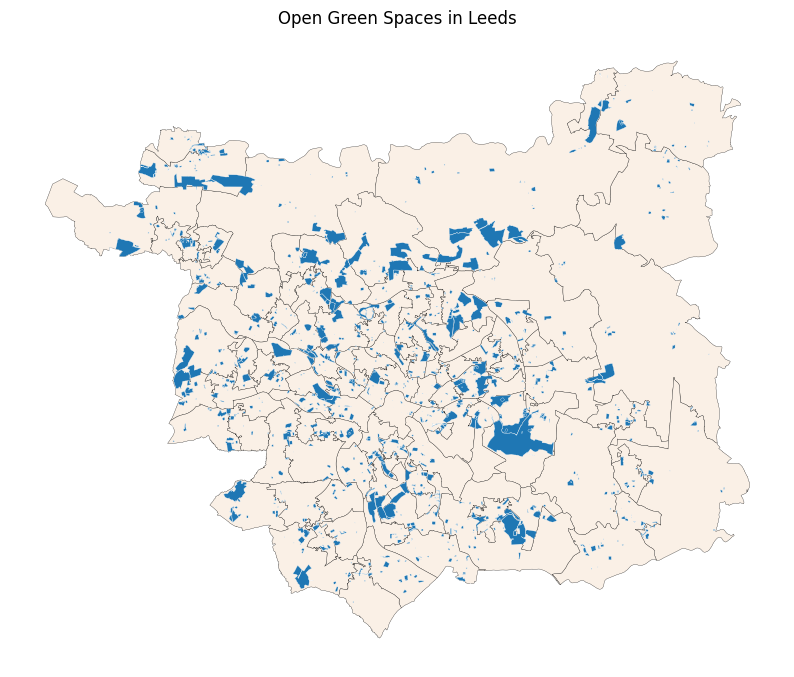

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,10), )
Wards.plot(ax = ax, facecolor = '#FAF0E6', edgecolor = 'black', linewidth = 0.2)
green_clip.plot(ax = ax, edgecolor = 'white', linewidth = 0.2)
ax.set_axis_off() #remove axes
plt.title('Open Green Spaces in Leeds')
plt.show()

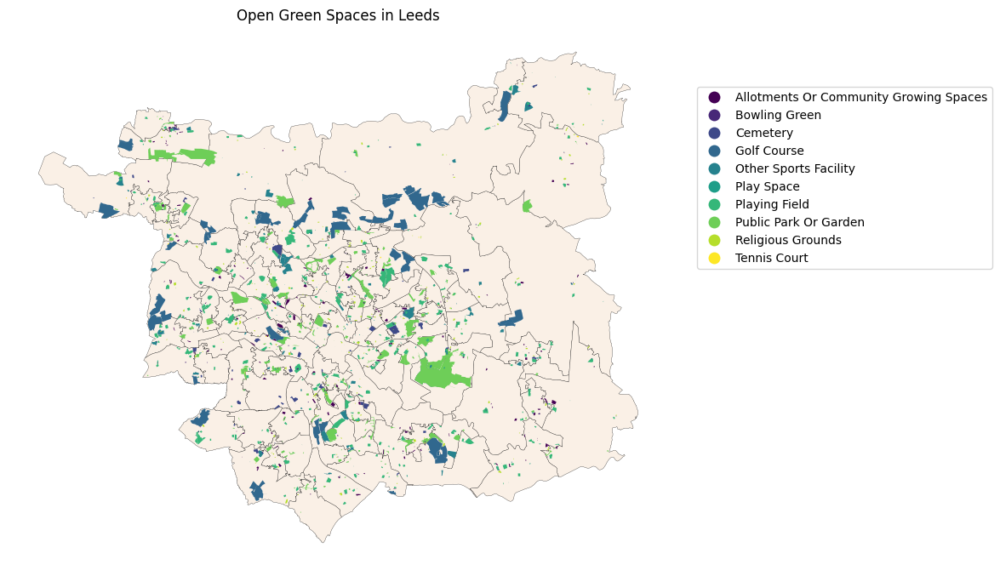

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,10), )
Wards.plot(ax = ax, facecolor = '#FAF0E6', edgecolor = 'black', linewidth = 0.2)
green_clip.plot(ax = ax, column = 'function', cmap = 'viridis', legend=True)
ax.set_axis_off()
plt.title('Open Green Spaces in Leeds')
leg = ax.get_legend() #add the legend
leg.set_bbox_to_anchor((1.5,0.9))
plt.show()

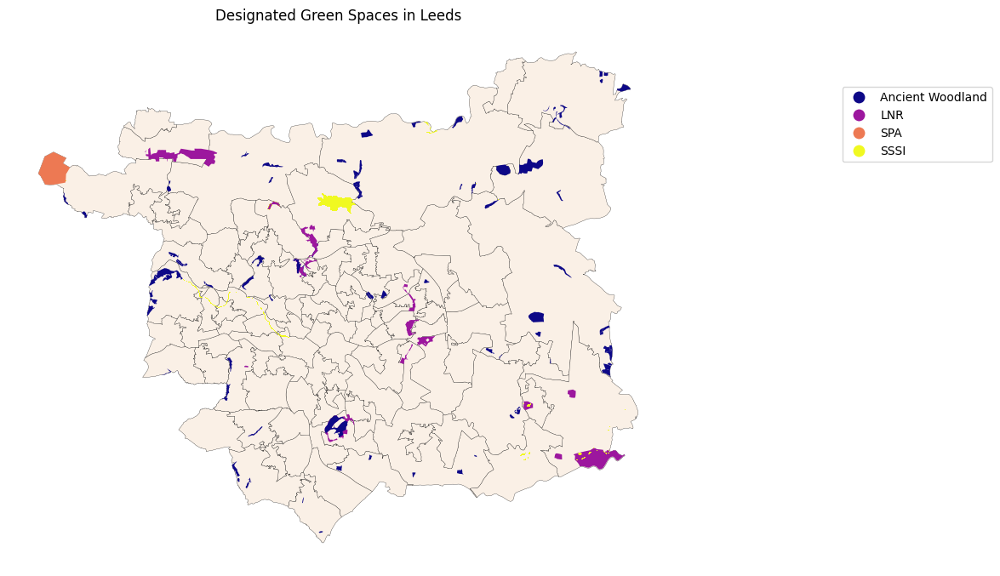

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,10), )
Wards.plot(ax = ax, facecolor = '#FAF0E6', edgecolor = 'black', linewidth = 0.2)
Designated.plot(ax = ax, column = 'Designate', cmap = 'plasma', legend=True)
ax.set_axis_off()
plt.title('Designated Green Spaces in Leeds')
leg = ax.get_legend() #add the legend
leg.set_bbox_to_anchor((1.5,0.9))
plt.show()

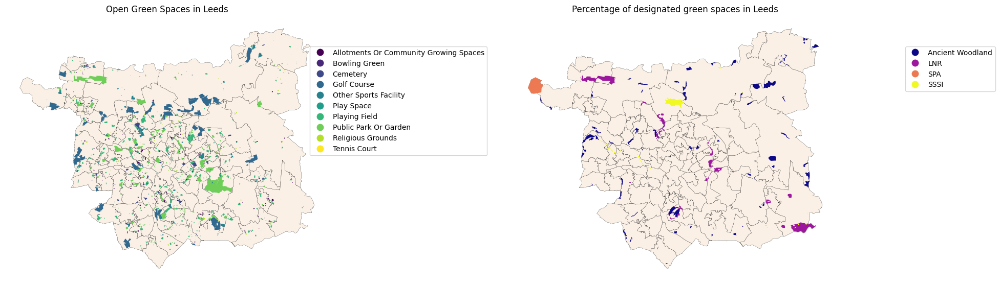

In [ ]:
# Plot species count distribution of most common cetacean species in the UK
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))

# Extract individual axes from the grid
ax1, ax2 = axes.ravel()

Wards.plot(ax = ax1, facecolor = '#FAF0E6', edgecolor = 'black', linewidth = 0.2)
green_clip.plot(ax = ax1, column = 'function', cmap = 'viridis', legend=True)
leg1 = ax1.get_legend()
leg1.set_bbox_to_anchor((1.5,0.9))
ax1.set_axis_off()
ax1.title.set_text('Open Green Spaces in Leeds')


Wards.plot(ax = ax2, facecolor = '#FAF0E6', edgecolor = 'black', linewidth = 0.2)
Designated.plot(ax = ax2, column = 'Designate', cmap = 'plasma', legend=True)
ax2.set_axis_off()
leg2 = ax2.get_legend()
leg2.set_bbox_to_anchor((1.5,0.9))
ax2.title.set_text('Percentage of designated green spaces in Leeds')

plt.tight_layout()
plt.show()

In [ ]:
# Join green_clip to Wards
Leeds_green = Wards.join(gpd.sjoin(green_clip, Wards).groupby("index_right").size().rename("number_of_spaces"),how="left")

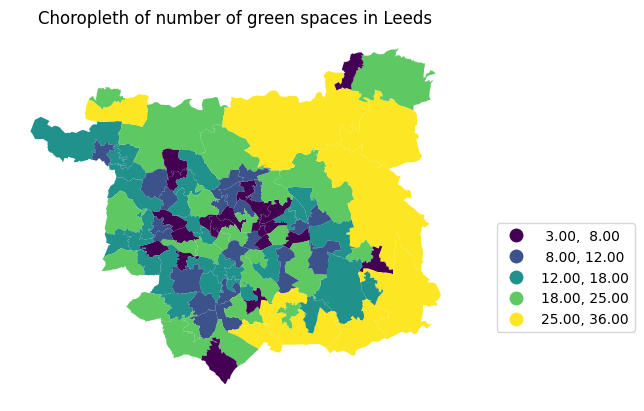

In [ ]:
fig, ax = plt.subplots(1) #create the figure
Leeds_green.plot(ax = ax,column = 'number_of_spaces', scheme = 'NaturalBreaks', k = 5,legend = True)
#add the plot, colouring by number of bus stops, divided into 5 quantiles
plt.title('Choropleth of number of green spaces in Leeds') #add a title
leg = ax.get_legend() #add the legend
leg.set_bbox_to_anchor((1.4,0.5)) #set the position of the legend- you can change these numbers to see how it works
ax.set_axis_off() #remove the axes
plt.show() #show the plot

## Calculate Percentage of Greenspaces

In [ ]:
Wards_cut = Wards.copy()
Wards_cut["geometry"] = Wards_cut.geometry.difference(green_clip.unary_union)

<ipython-input-17-8b7964fb4801>:2: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  Wards_cut["geometry"] = Wards_cut.geometry.difference(green_clip.unary_union)


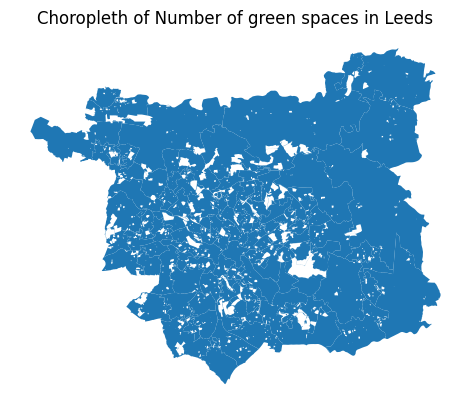

In [ ]:
fig, ax = plt.subplots(1) #create the figure
Wards_cut.plot(ax = ax, scheme = 'NaturalBreaks', k = 5,legend = True)
#add the plot, colouring by number of bus stops, divided into 5 quantiles
plt.title('Choropleth of Number of green spaces in Leeds') #add a title
leg = ax.get_legend() #add the legend
#leg.set_bbox_to_anchor((1.4,0.5)) #set the position of the legend- you can change these numbers to see how it works
ax.set_axis_off() #remove the axes
plt.show() #show the plot

In [ ]:
# Save as a Shapefile
Wards_cut.to_file("wards_cut.shp", driver="ESRI Shapefile")

In [ ]:
Wards_cut["area_no_green"] = Wards_cut.geometry.area
# Round average_count per record to whole number
Wards_cut['nogreen_km2'] = Wards_cut['area_no_green']/1000000

Wards_cut['nogreen_km2'] = Wards_cut['nogreen_km2'].round().astype(int)

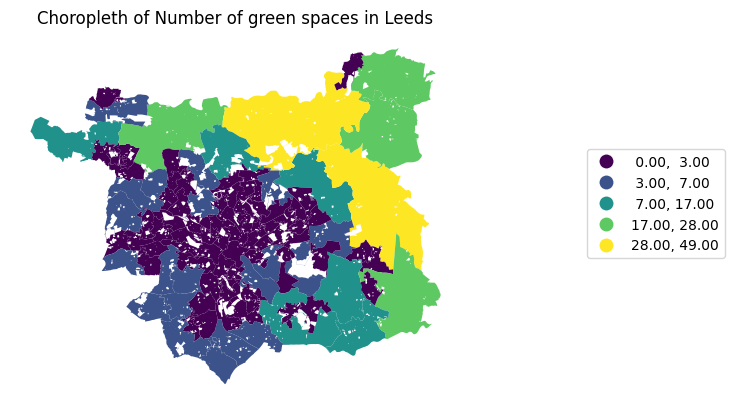

In [ ]:
fig, ax = plt.subplots(1) #create the figure
Wards_cut.plot(ax = ax,column = 'km2_round', scheme = 'NaturalBreaks', k = 5,legend = True)
#add the plot, colouring by number of bus stops, divided into 5 quantiles
plt.title('Choropleth of Number of green spaces in Leeds') #add a title
leg = ax.get_legend() #add the legend
leg.set_bbox_to_anchor((1.6,0.7)) #set the position of the legend- you can change these numbers to see how it works
ax.set_axis_off() #remove the axes
plt.show() #show the plot

In [ ]:
Wards["area_m2"] = Wards.geometry.area
# Round average_count per record to whole number
Wards['km2_round'] = Wards['area_m2']/1000000

Wards['km2_round'] = Wards['km2_round'].round().astype(int)

In [ ]:
Wards_cut_filtered = Wards_cut.drop(columns=['OBJECTID', 'MSOA11NM', 'LONG', 'LAT', 'Location', 'geometry', 'area_m2', 'km2_round'])

# Join original wards with cut out wards
Wards2 = Wards.join(Wards_cut_filtered.set_index('MSOA11CD'), on='MSOA11CD')

In [ ]:
# Calculate the area of the green spaces in each ward
Wards2['area_diff'] = Wards2['area_m2'] - Wards2['area_no_green']

In [ ]:
# Calculate the proportion of green spaces per ward
Wards2['green_percent'] = Wards2['area_diff']/Wards2['area_m2']*100
# Round percentage to whole number
Wards2['green_percent'] = Wards2['green_percent'].round().astype(int)

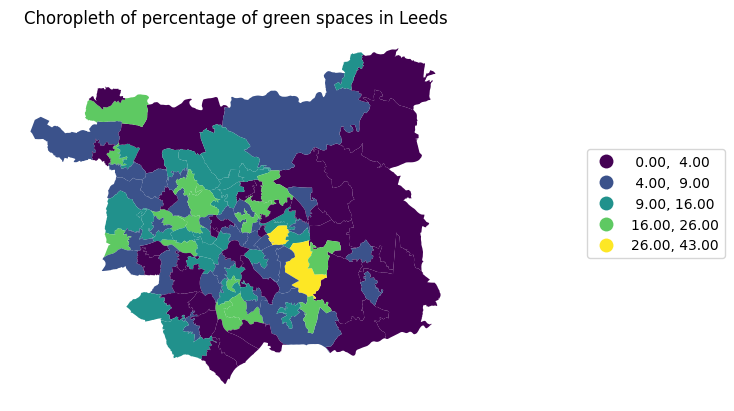

In [ ]:
fig, ax = plt.subplots(1) #create the figure
Wards2.plot(ax = ax,column = 'green_percent', scheme = 'NaturalBreaks', k = 5,legend = True)
plt.title('Choropleth of percentage of green spaces in Leeds') #add a title
leg = ax.get_legend() #add the legend
leg.set_bbox_to_anchor((1.6,0.7)) #set the position of the legend- you can change these numbers to see how it works
ax.set_axis_off() #remove the axes
plt.show() #show the plot

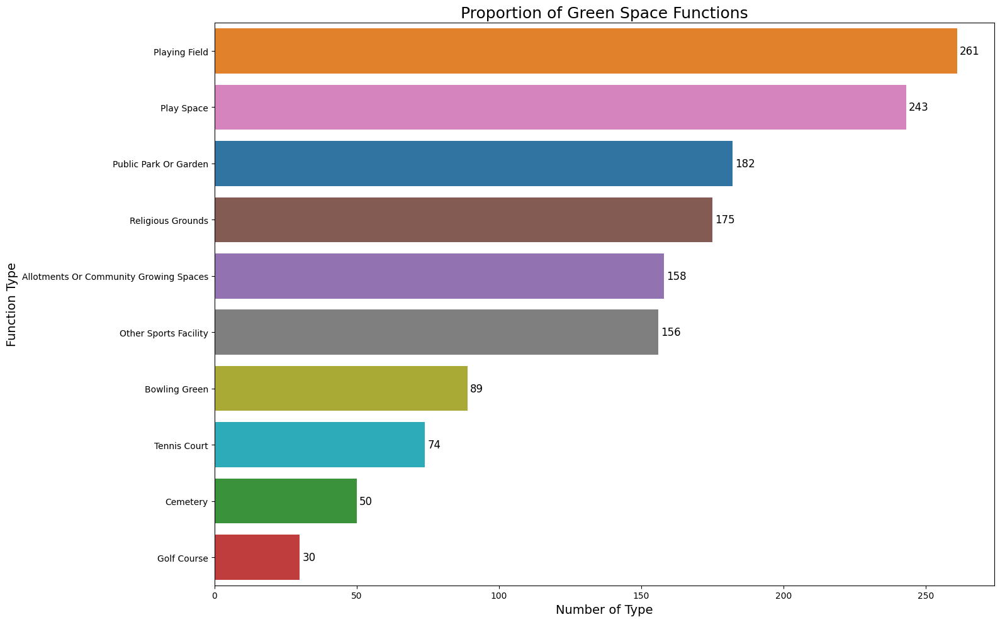

In [ ]:
# Plot number of species records
fig, ax = plt.subplots(figsize=(16, 10))

# Horizontal bar plot
sns.countplot(
    data=green_clip,
    y='function',
    hue='function',
    order=green_clip['function'].value_counts().index,
  )
plt.xlabel('Number of Type', fontsize=14)
plt.ylabel('Function Type', fontsize=14)
plt.title('Proportion of Green Space Functions', fontsize=18)

# Add annotation to bars
for container in ax.containers:
    ax.bar_label(container, padding=3, fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
Wards.head()

,OBJECTID,MSOA11CD,MSOA11NM,LONG,LAT,Location,geometry,area_m2,km2_round,green_percent
0,1716,E02002337,Leeds 008,-1.752,53.880,North,"POLYGON ((418310.512 440995.504, 418283.825 44...",1.488289e+07,15,6
1,1718,E02002339,Leeds 010,-1.692,53.868,North,"POLYGON ((420442.406 442436.687, 420443.313 44...",1.413270e+06,1,20
2,1719,E02002340,Leeds 011,-1.678,53.868,North,"POLYGON ((421248.688 442315.812, 421284.072 44...",2.175963e+06,2,11
3,2527,E02002336,Leeds 007,-1.639,53.883,North,"POLYGON ((422959.334 445561.228, 422975.661 44...",2.879803e+07,29,4
4,1717,E02002338,Leeds 009,-1.709,53.870,North,"POLYGON ((419597.106 440500.097, 419562.826 44...",2.126169e+06,2,4


## Calculate Percentage of Designated Sites

In [ ]:
Quality_cut = Wards.copy()
Quality_cut["geometry"] = Quality_cut.geometry.difference(Designated.unary_union)

Quality_cut["area_no_desig"] = Quality_cut.geometry.area

Quality_cut_filtered = Quality_cut.drop(columns=['OBJECTID', 'MSOA11NM', 'LONG', 'LAT', 'Location', 'geometry', 'area_m2', 'km2_round', 'green_percent'])

# Join original wards with cut out wards
Wards3 = Wards.join(Quality_cut_filtered.set_index('MSOA11CD'), on='MSOA11CD')

# Calculate the area of the green spaces in each ward
Wards3['area_diff'] = Wards3['area_m2'] - Wards3['area_no_desig']

# Calculate the proportion of green spaces per ward
Wards3['quality_percent'] = Wards3['area_diff']/Wards3['area_m2']*100
# Round percentage to whole number
Wards3['quality_percent'] = Wards3['quality_percent'].round().astype(int)

<ipython-input-77-0f0115e6f550>:2: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  Quality_cut["geometry"] = Quality_cut.geometry.difference(Designated.unary_union)


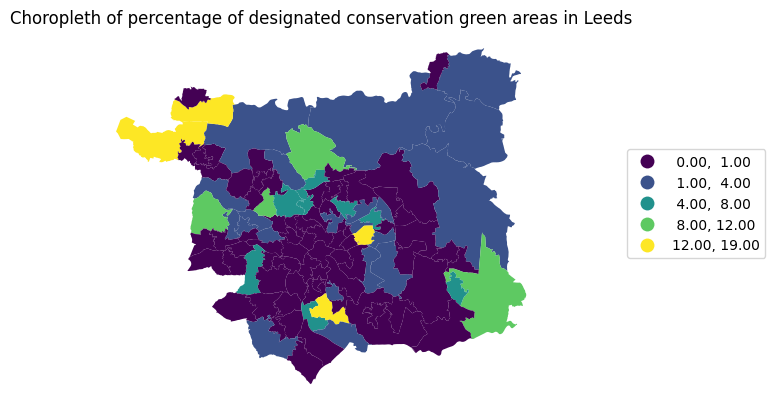

In [ ]:
fig, ax = plt.subplots(1) #create the figure
Wards3.plot(ax = ax,column = 'quality_percent', scheme = 'NaturalBreaks', k = 5,legend = True)
plt.title('Choropleth of percentage of designated conservation green areas in Leeds') #add a title
leg = ax.get_legend() #add the legend
leg.set_bbox_to_anchor((1.5,0.7)) #set the position of the legend- you can change these numbers to see how it works
ax.set_axis_off() #remove the axes
plt.show() #show the plot

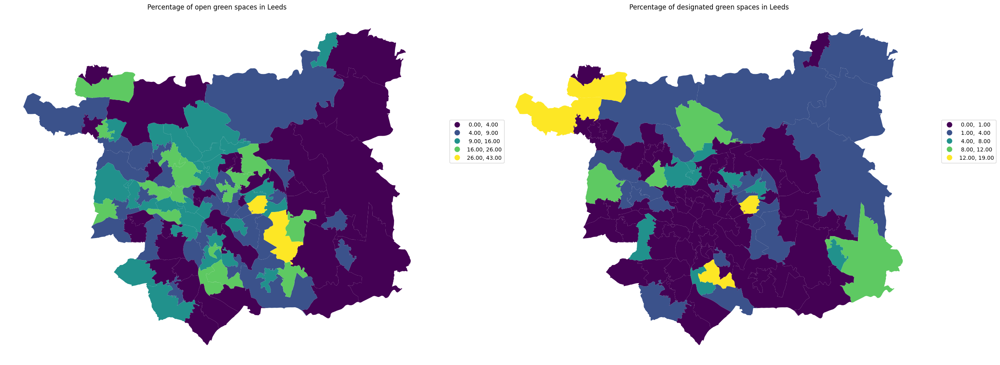

In [ ]:
# Plot species count distribution of most common cetacean species in the UK
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 20))

# Extract individual axes from the grid
ax1, ax2 = axes.ravel()

Wards2.plot(ax = ax1,column = 'green_percent', cmap = 'viridis', scheme = 'NaturalBreaks', k = 5,legend = True)
leg1 = ax1.get_legend()
leg1.set_bbox_to_anchor((1.18,0.7))
ax1.set_axis_off()
ax1.title.set_text('Percentage of open green spaces in Leeds')

Wards3.plot(ax = ax2,column = 'quality_percent', cmap = 'viridis', scheme = 'NaturalBreaks', k = 5,legend = True)
ax2.set_axis_off()
leg2 = ax2.get_legend()
leg2.set_bbox_to_anchor((1.18,0.7))
ax2.title.set_text('Percentage of designated green spaces in Leeds')

plt.tight_layout()
plt.show()

In [ ]:
percent_bins = [0, 1, 5, 10, 15, 20,45]
percent_labels = ['0', '1-5', '5-10', '10-15', '15-20', '20-45']

Wards2['percent_bin'] = pd.cut(Wards2['green_percent'], bins=percent_bins, labels=percent_labels)

Wards3['percent_bin'] = pd.cut(Wards3['quality_percent'], bins=percent_bins, labels=percent_labels)

In [ ]:
# Fill missing values in 'locality' column with 'Unknown'
Wards2.loc[:, 'percent_bin'] = Wards2['percent_bin'].fillna('0')
# Fill missing values in 'locality' column with 'Unknown'
Wards3.loc[:, 'percent_bin'] = Wards3['percent_bin'].fillna('0')

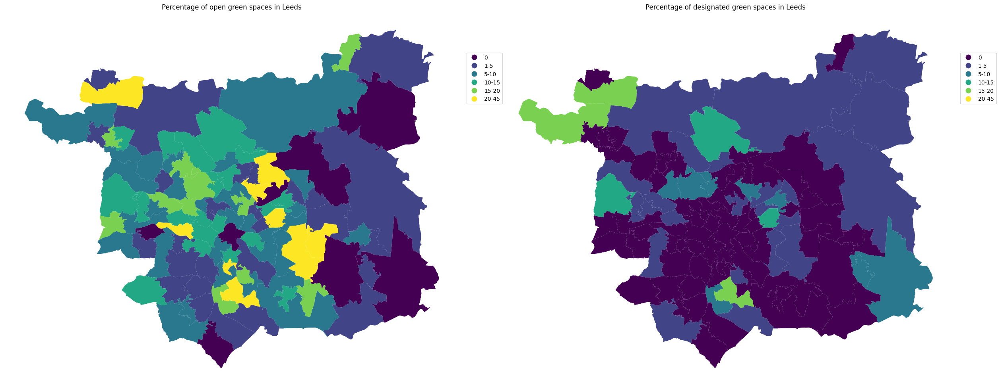

In [ ]:
# Plot species count distribution of most common cetacean species in the UK
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 20))

# Extract individual axes from the grid
ax1, ax2 = axes.ravel()

Wards2.plot(ax = ax1,column = 'percent_bin', cmap = 'viridis', legend = True)
leg1 = ax1.get_legend()
leg1.set_bbox_to_anchor((1.1,0.9))
ax1.set_axis_off()
ax1.title.set_text('Percentage of open green spaces in Leeds')

Wards3.plot(ax = ax2,column = 'percent_bin', cmap = 'viridis', legend = True)
ax2.set_axis_off()
leg2 = ax2.get_legend()
leg2.set_bbox_to_anchor((1.1,0.9))
ax2.title.set_text('Percentage of designated green spaces in Leeds')

plt.tight_layout()
plt.show()

## Global and Local Spatial Analysis


In [ ]:
pip install palettable descartes pysal matplotlib_scalebar geopandas contextily

In [ ]:
import pandas as pd
import numba
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import palettable as pltt
import descartes
from pysal.viz import mapclassify
import numpy as np
import statsmodels.api as sm
import scipy.stats as stats
#import contextily as cx
%matplotlib inline
from pysal.lib import weights
from pysal.lib import io
import contextily as cx

In [ ]:
from pysal.explore import esda
from pysal.viz import splot
#add set the position of the legend
from splot.esda import moran_scatterplot, lisa_cluster, plot_local_autocorrelation
#add patches for custom legends
import matplotlib.patches as mpatches

/usr/local/lib/python3.11/dist-packages/spaghetti/network.py:41: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


In [ ]:
w_queen = weights.Queen.from_dataframe(Wards2, ids = 'MSOA11CD')

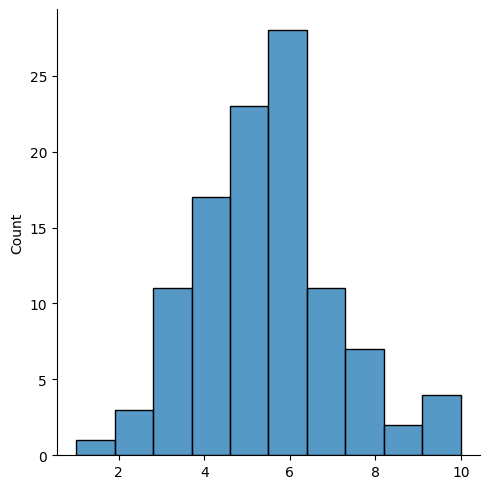

In [ ]:
queen_card = pd.Series(w_queen.cardinalities)
sns.displot(queen_card, bins = 10)

In [ ]:
w_queen.transform = 'R' #standardise across rows
w_queen_score = weights.lag_spatial(w_queen, Wards2['green_percent'])

In [ ]:
Wards2['W_Q_Score'] = w_queen_score

In [ ]:
std_green = (Wards2['green_percent'] - Wards2['green_percent'].mean()) / Wards2['green_percent'].std() # calculate standardised scores
std_w_green =pd.Series(weights.lag_spatial(w_queen, std_green), index = std_green.index) #compute spatial lag

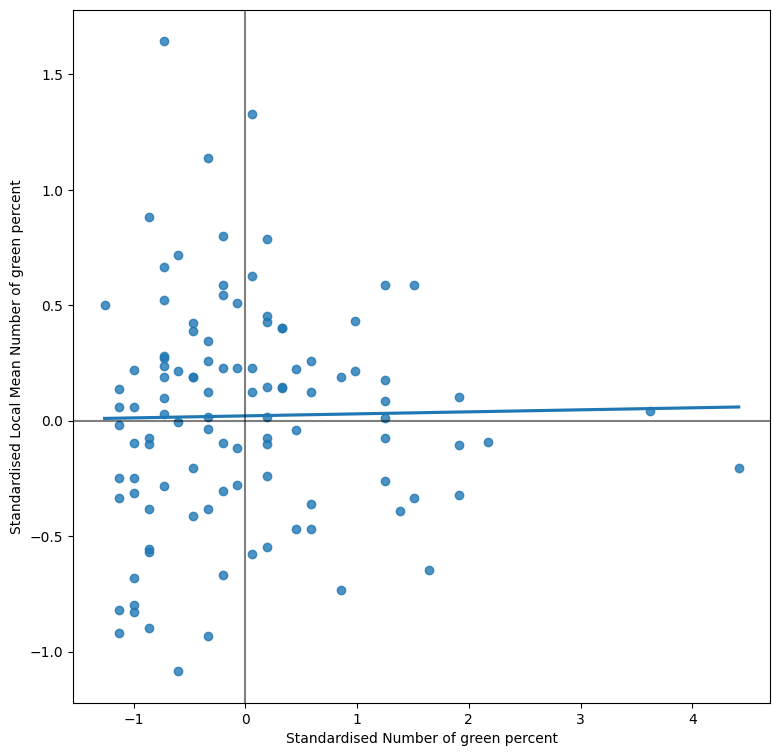

In [ ]:
fig, ax = plt.subplots(1, figsize=(9,9))
sns.regplot(x = std_green, y = std_w_green, ci=None)
plt.xlabel('Standardised Number of green percent')
plt.ylabel('Standardised Local Mean Number of green percent')
plt.axvline(0, c='k', alpha = 0.5) #add vertical 0 line
plt.axhline(0, c='k', alpha = 0.5)
plt.show()

In [ ]:
#find the maximum value for the number of bus stops
Wards2.green_percent.max()

43

In [ ]:
green_sort = Wards2.green_percent.tolist() #create a list of the bus stop numbers
green_sort.remove(max(green_sort)) #remove maximum value

#Wards2['green_percent_Clean'] = Wards2.green_percent #create a new column
Wards2['green_percent_Clean'] = Wards2['green_percent'].where(Wards2['green_percent'] <= 35, other=None)
#Wards2.loc[Wards2['green_percent']>40, 'green_percent_Clean'] = max(green_sort)

In [ ]:
Wards2.green_percent_Clean.max()

26.0

In [ ]:
std_green = (Wards2['green_percent_Clean'] - Wards2['green_percent_Clean'].mean()) / Wards2['green_percent_Clean'].std() # calculate standardised scores
std_w_green =pd.Series(weights.lag_spatial(w_queen, std_green), index = std_green.index) #compute spatial lag

Cleaned data had nan moran's i result

In [ ]:
mi = esda.Moran(Wards2['green_percent'], w_queen)

In [ ]:
#print the I value
print(mi.I)

0.00871693304671586


In [ ]:
#print the p values
print(mi.p_sim)

0.344


(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.01)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

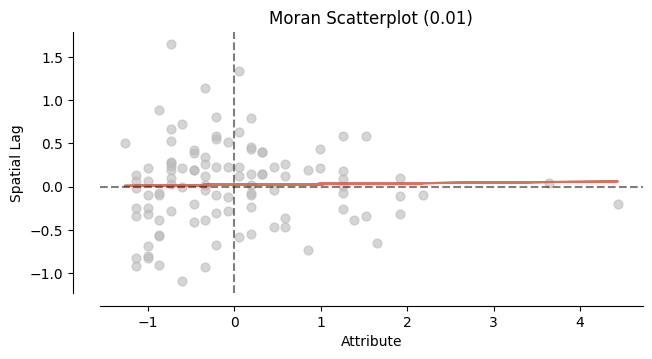

In [ ]:
moran_scatterplot(mi) #create the scatterplot

In [ ]:
lisa = esda.Moran_Local(Wards2['green_percent'], w_queen)

(<Figure size 640x480 with 1 Axes>, <Axes: >)

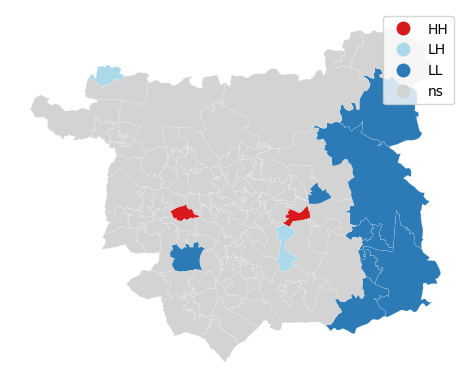

In [ ]:
lisa_cluster(lisa, Wards2)

In [ ]:
w_queen2 = weights.Queen.from_dataframe(Wards3, ids = 'MSOA11CD')

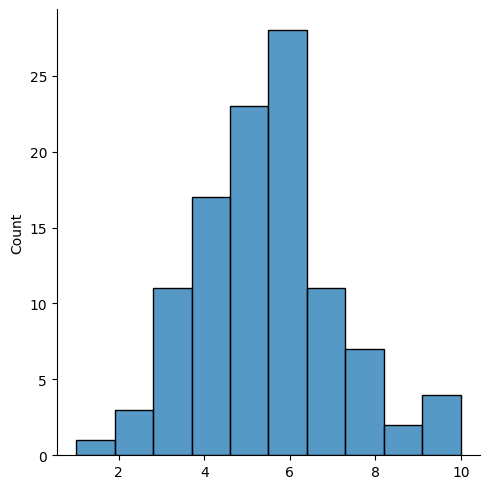

In [ ]:
queen_card = pd.Series(w_queen2.cardinalities)
sns.displot(queen_card, bins = 10)

In [ ]:
w_queen2.transform = 'R' #standardise across rows
w_queen2_score = weights.lag_spatial(w_queen2, Wards3['quality_percent'])

Wards3['W_Q_Score'] = w_queen2_score

std_green2 = (Wards3['quality_percent'] - Wards3['quality_percent'].mean()) / Wards3['quality_percent'].std() # calculate standardised scores
std_w_green2 =pd.Series(weights.lag_spatial(w_queen2, std_green), index = std_green.index) #compute spatial lag

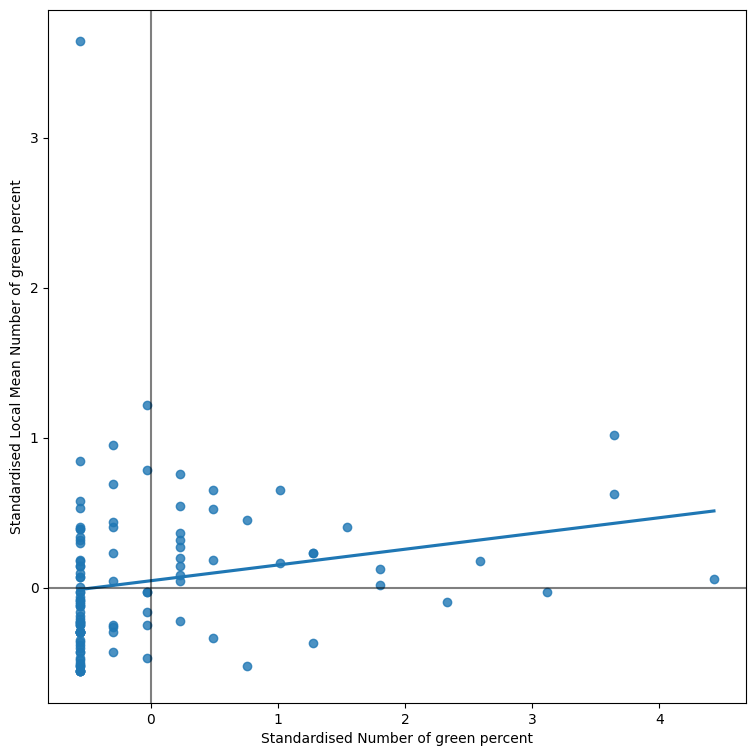

In [ ]:
fig, ax = plt.subplots(1, figsize=(9,9))
sns.regplot(x = std_green2, y = std_w_green2, ci=None)
plt.xlabel('Standardised Number of green percent')
plt.ylabel('Standardised Local Mean Number of green percent')
plt.axvline(0, c='k', alpha = 0.5) #add vertical 0 line
plt.axhline(0, c='k', alpha = 0.5)
plt.show()

In [ ]:
mi = esda.Moran(Wards3['quality_percent'], w_queen2)
#print the I value
print(mi.I)

0.10502963747372375


In [ ]:
#print the p values
print(mi.p_sim)

0.029


(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.11)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

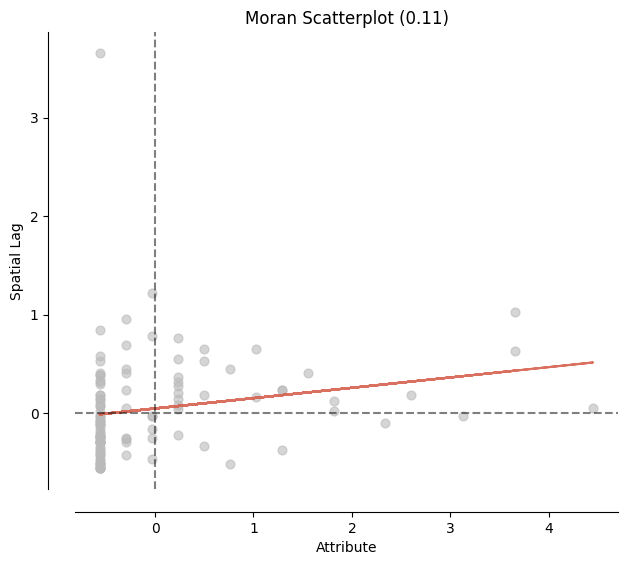

In [ ]:
moran_scatterplot(mi) #create the scatterplot

(<Figure size 640x480 with 1 Axes>, <Axes: >)

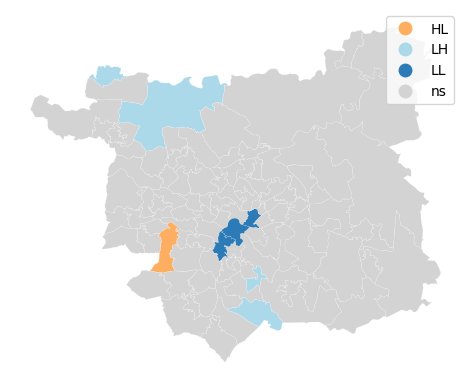

In [ ]:
lisa = esda.Moran_Local(Wards3['quality_percent'], w_queen2)
lisa_cluster(lisa, Wards3)

## Set up

In [ ]:
import time
import esda
import libpysal
import osmnx as ox
import numpy as np
import pandas as pd
import networkx as nx
import geopandas as gpd
import contextily as cx
import dask.dataframe as dd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from joblib import Parallel, delayed
from shapely.geometry import Point
from dask import delayed, compute
from scipy.spatial import cKDTree
from shapely.geometry import box
from rtree import index
from tqdm import tqdm

## Load Data

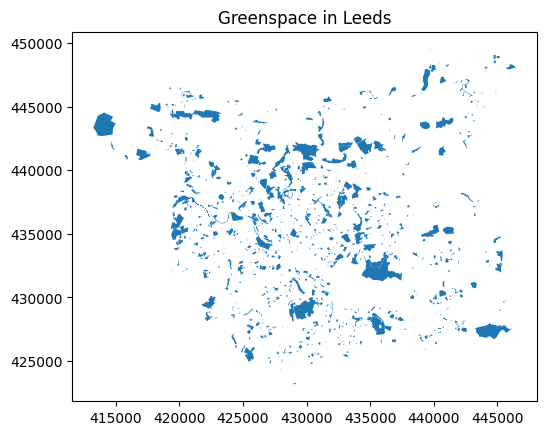

In [ ]:
# green space data

greenspace = gpd.read_file('greenspace.shp')
# greenspace = gpd.read_file('greenspace_test.shp')
greenspace.plot()
plt.title('Greenspace in Leeds')
plt.show()

In [ ]:
greenspace.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1094 entries, 0 to 1093
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   id         1094 non-null   object  
 1   function   1094 non-null   object  
 2   distName1  0 non-null      object  
 3   id_2       0 non-null      float64 
 4   Designate  1094 non-null   object  
 5   area       1094 non-null   float64 
 6   geometry   1094 non-null   geometry
dtypes: float64(2), geometry(1), object(4)
memory usage: 60.0+ KB


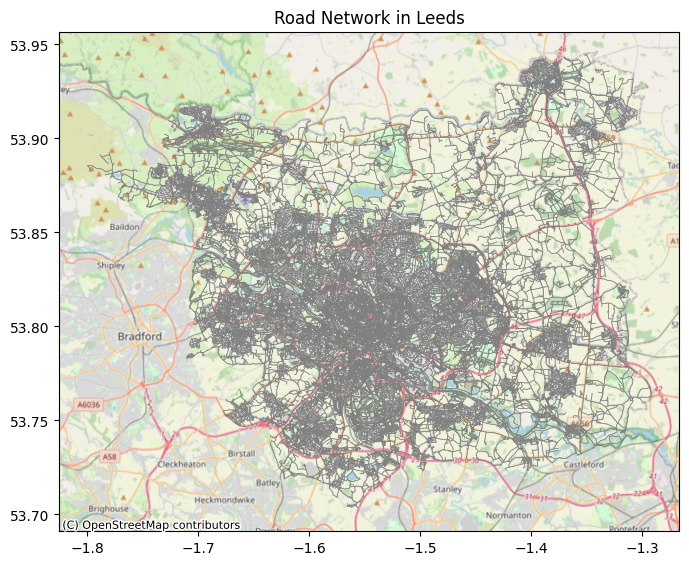

In [ ]:
# road network data

# # download the road network for Leeds
# G = ox.graph_from_place("Leeds, UK", network_type="all")
# ox.save_graphml(G, "leeds_walk_network.graphml")

G = ox.load_graphml("leeds_network.graphml")

# plot the road network except motorways
edges = ox.graph_to_gdfs(G, nodes=False, edges=True)
edges = edges[~edges["highway"].isin(["motorway", "motorway_link"])]

fig, ax = plt.subplots(figsize=(8, 8))
edges.plot(ax=ax, linewidth=0.5, edgecolor="gray", alpha=0.8)
cx.add_basemap(ax, crs=edges.crs, source=cx.providers.OpenStreetMap.Mapnik)

ax.set_title("Road Network in Leeds", fontsize=12)

plt.show()


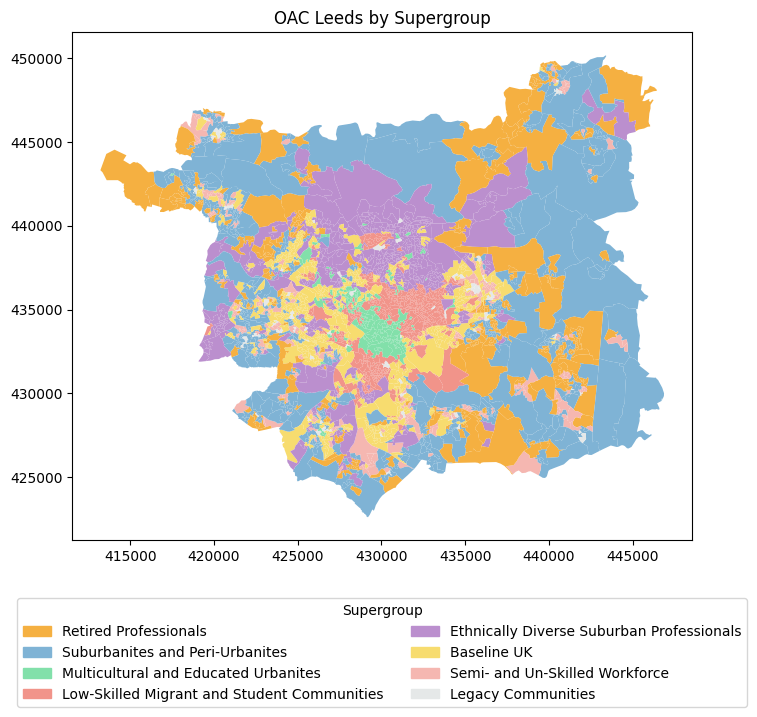

In [ ]:
# UK Output Area Classification (OAC) data
# define ledgend and color
legend_mapping = {
    1: 'Retired Professionals',
    2: 'Suburbanites and Peri-Urbanites',
    3: 'Multicultural and Educated Urbanites',
    4: 'Low-Skilled Migrant and Student Communities',
    5: 'Ethnically Diverse Suburban Professionals',
    6: 'Baseline UK',
    7: 'Semi- and Un-Skilled Workforce',
    8: 'Legacy Communities'
}

color_classification = {
    1: '#F5B041',2: '#7FB3D5',3: '#82E0AA',4: '#F1948A',5: '#BB8FCE',6: '#F7DC6F',7: '#F5B7B1',8: '#E5E8E8'
    }

oac = gpd.read_file('OAC_leeds.shp')
# oac = gpd.read_file('OAC_test.shp')

oac['color'] = oac['sg'].map(color_classification)
fig_oac, ax_oac = plt.subplots(figsize=(8, 8))
oac.plot(ax=ax_oac, color=oac['color'], legend=False)

# custom legend
handles_oac = []
for key, value in legend_mapping.items():
    color = color_classification.get(key, "#FFFFFF")
    handles_oac.append(mpatches.Patch(color=color, label=value))

ax_oac.set_title('OAC Leeds by Supergroup')
ax_oac.legend(handles=handles_oac, title='Supergroup', bbox_to_anchor=(0.5, -0.1), loc='upper center', ncol=2)
plt.show()


In [ ]:
oac.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2607 entries, 0 to 2606
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   fid_1       2607 non-null   float64 
 1   OA21CD      2607 non-null   object  
 2   la23cd      2607 non-null   object  
 3   sg          2607 non-null   float64 
 4   g           2607 non-null   object  
 5   subg        2607 non-null   object  
 6   Shape_Leng  2607 non-null   float64 
 7   Shape_Area  2607 non-null   float64 
 8   geometry    2607 non-null   geometry
 9   color       2607 non-null   object  
dtypes: float64(4), geometry(1), object(5)
memory usage: 203.8+ KB


## Spatial Analysis

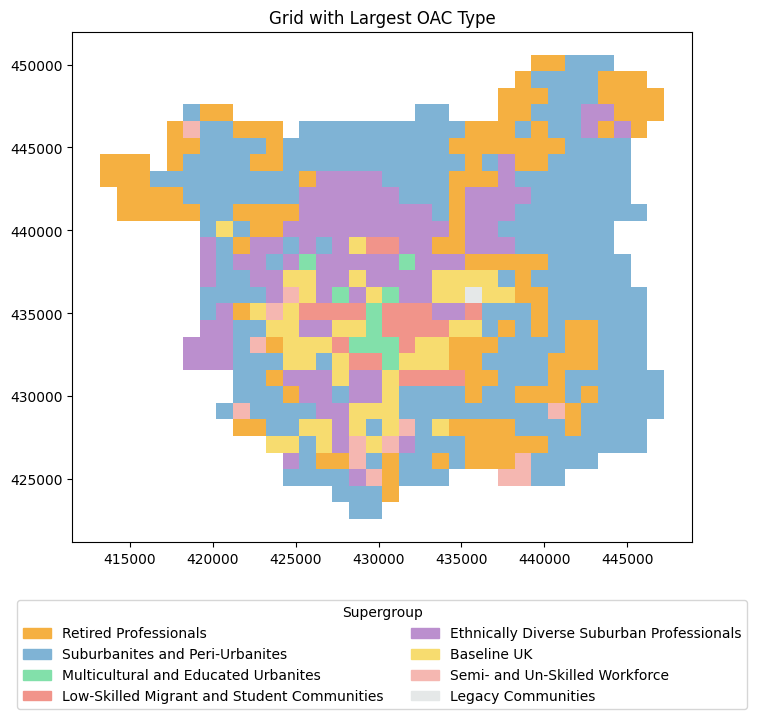

In [ ]:
# create a grid of 1km x 1km cells
minx, miny, maxx, maxy = oac.total_bounds

grid_cells = []
for x0 in np.arange(minx, maxx, 1000):
    for y0 in np.arange(miny, maxy, 1000):
        x1 = x0 + 1000
        y1 = y0 + 1000
        grid_cells.append(box(x0, y0, x1, y1))

grid = gpd.GeoDataFrame(grid_cells, columns=['geometry'], crs=oac.crs)

# calculate the number of greenspace in each grid cell
def get_largest_oac_type(cell, oac):
    intersection = oac[oac.intersects(cell)]
    if intersection.empty:
        return None
    intersection = intersection.copy()
    # calculate the area of intersection
    intersection['area'] = intersection.geometry.intersection(cell).area
    largest_oac = intersection.loc[intersection['area'].idxmax()]
    return largest_oac['sg']

grid['largest_oac_type'] = grid['geometry'].apply(lambda cell: get_largest_oac_type(cell, oac))
# calculate the centroid of each grid cell
grid['center'] = grid['geometry'].centroid

# visualize the grid
fig, ax = plt.subplots(figsize=(8, 8))

# color the grid cells based on the largest OAC type
for sg_value, color in color_classification.items():
    subset = grid[grid['largest_oac_type'] == sg_value]
    if not subset.empty:
        subset.plot(ax=ax, facecolor=color, edgecolor='none')

patches = [mpatches.Patch(color=color, label=legend_mapping.get(key, "Unknown"))
           for key, color in color_classification.items()]

ax.legend(handles=patches, title='Supergroup', bbox_to_anchor=(0.5, -0.1), loc='upper center', ncol=2)
ax.set_title('Grid with Largest OAC Type')

plt.show()

In [ ]:
# project all data to British National Grid (EPSG:27700)
target_crs = "EPSG:27700"

grid = grid.to_crs(target_crs)
oac = oac.to_crs(target_crs)
greenspace = greenspace.to_crs(target_crs)
G = ox.project_graph(G, to_crs=target_crs)

In [ ]:
# Convert the road network into nodes and edges GeoDataFrames
nodes, edges = ox.graph_to_gdfs(G)

# Ensure the edges GeoDataFrame has a MultiIndex (should include (u, v, key))
# The MultiIndex (u, v, key) uniquely identifies each edge in the road network
if not isinstance(edges.index, pd.MultiIndex):
    edges = edges.set_index(['u', 'v', 'key'])

# Extract node IDs from the edges' MultiIndex
node_ids = set(edges.index.get_level_values(0)).union(set(edges.index.get_level_values(1)))
nodes_filtered = nodes.loc[nodes.index.isin(node_ids)]

# Reconstruct the road network graph
G_processed = ox.graph_from_gdfs(nodes_filtered, edges)

print("road network nodes:", len(nodes))

road network nodes: 105266


In [ ]:
grid_clipped = gpd.clip(grid, oac)

print("original grid:", len(grid))
print("grid clipped:", len(grid_clipped))

original grid: 952
grid clipped: 625


In [ ]:
# # calculate Reachable Greenspaces from Grid Centers

# # find the nearest node to each grid cell center and greenspace
# grid_clipped['nearest_node'] = grid_clipped['center'].apply(lambda pt: ox.distance.nearest_nodes(G_processed, pt.x, pt.y))
# greenspace['centroid'] = greenspace.geometry.centroid
# greenspace['nearest_node'] = greenspace['centroid'].apply(lambda pt: ox.distance.nearest_nodes(G_processed, pt.x, pt.y))

# # *** Walking Accessibility ***
# # assume the average walking speed is 1.4 m/s (5 km/h)
# walking_speed = 1.4  # m/s
# walking_distance_threshold = walking_speed * 20 * 60  # 1680 m

# greenspace_counts_walk = []
# reachable_ids_walk_list = []

# # compute the number of reachable greenspaces within the walking distance threshold for each grid cell
# start_time = time.time()
# for idx, row in tqdm(grid_clipped.iterrows(), total=len(grid_clipped), desc="Computing Walking Accessibility"):
#     source_node = row['nearest_node']
#     # compute the shortest path lengths from the source node to all other nodes within the walking distance threshold
#     reachable_dict_walk = nx.single_source_dijkstra_path_length(
#         G_processed, source=source_node, cutoff=walking_distance_threshold, weight='length'
#     )
#     reachable_nodes_walk = set(reachable_dict_walk.keys())
#     # filter the greenspaces that are reachable
#     reachable_gs_walk = greenspace[greenspace['nearest_node'].isin(reachable_nodes_walk)]
#     # store the number of reachable greenspaces and their IDs
#     count_walk = len(reachable_gs_walk)
#     greenspace_counts_walk.append(count_walk)
#     reachable_ids_walk_list.append(list(reachable_gs_walk.index))
# end_time = time.time()
# print(f"Process 1 finish: {(end_time - start_time)/60} mins")

# # add walking accessibility results to the grid
# grid_clipped['greenspace_count_walk'] = greenspace_counts_walk
# grid_clipped['reachable_ids'] = reachable_ids_walk_list

# # *** Cycling Accessibility ***
# # assume the average cycling speed is 15 km/h (4.17 m/s)
# cycling_speed = 4.17  # m/s
# cycling_distance_threshold = cycling_speed * 20 * 60  # 5004 m

# greenspace_counts_bike = []
# reachable_ids_bike_list = []

# # compute the number of reachable greenspaces within the cycling distance threshold for each grid cell
# start_time = time.time()
# for idx, row in tqdm(grid_clipped.iterrows(), total=len(grid_clipped), desc="Computing Cycling Accessibility"):
#     source_node = row['nearest_node']
#     reachable_dict_bike = nx.single_source_dijkstra_path_length(
#         G_processed, source=source_node, cutoff=cycling_distance_threshold, weight='length'
#     )
#     reachable_nodes_bike = set(reachable_dict_bike.keys())
#     reachable_gs_bike = greenspace[greenspace['nearest_node'].isin(reachable_nodes_bike)]
#     count_bike = len(reachable_gs_bike)
#     greenspace_counts_bike.append(count_bike)
#     reachable_ids_bike_list.append(list(reachable_gs_bike.index))
# end_time = time.time()
# print(f"Process 2 finish: {(end_time - start_time)/60} mins")

# # add cycling accessibility results to the grid
# grid_clipped['greenspace_count_bike'] = greenspace_counts_bike
# grid_clipped['reachable_ids_bike'] = reachable_ids_bike_list


In [ ]:

# compute the number of reachable greenspaces within the walking distance threshold for each grid cell
grid_clipped['nearest_node'] = grid_clipped['center'].apply(lambda pt: ox.distance.nearest_nodes(G_processed, pt.x, pt.y))
greenspace['centroid'] = greenspace.geometry.centroid
greenspace['nearest_node'] = greenspace['centroid'].apply(lambda pt: ox.distance.nearest_nodes(G_processed, pt.x, pt.y))

# define function to compute accessibility
def compute_accessibility(row, distance_threshold):
    source_node = row['nearest_node']
    try:
        reachable_dict = nx.single_source_dijkstra_path_length(
            G_processed, source=source_node, cutoff=distance_threshold, weight='length'
        )
        reachable_nodes = set(reachable_dict.keys())
        reachable_gs = greenspace[greenspace['nearest_node'].isin(reachable_nodes)]
        return len(reachable_gs), list(reachable_gs.index)
    except:
        return 0, []

# parameters
walking_speed = 1.4  # m/s
walking_distance_threshold = walking_speed * 20 * 60  # 1680m

cycling_speed = 4.17  # m/s
cycling_distance_threshold = cycling_speed * 20 * 60  # 5004m

# compute walking accessibility
# start_time = time.time()
delayed_walk = [delayed(compute_accessibility)(row, walking_distance_threshold) for _, row in grid_clipped.iterrows()]
walk_results = compute(*delayed_walk, scheduler='threads')  x

grid_clipped['greenspace_count_walk'], grid_clipped['reachable_ids_walk'] = zip(*walk_results)

# end_time = time.time()
# print(f"Walking Accessibility finished in {(end_time - start_time)/60:.2f} mins")

# compute cycling accessibility
# start_time = time.time()
delayed_bike = [delayed(compute_accessibility)(row, cycling_distance_threshold) for _, row in grid_clipped.iterrows()]
bike_results = compute(*delayed_bike, scheduler='threads')

grid_clipped['greenspace_count_bike'], grid_clipped['reachable_ids_bike'] = zip(*bike_results)

# end_time = time.time()
# print(f"Cycling Accessibility finished in {(end_time - start_time)/60:.2f} mins")

# grid_clipped.to_file("greenspace_accessibility_results.shp")


C:\Users\abc96\AppData\Local\Temp\ipykernel_39052\1249306143.py:29: UserWarning:

Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler



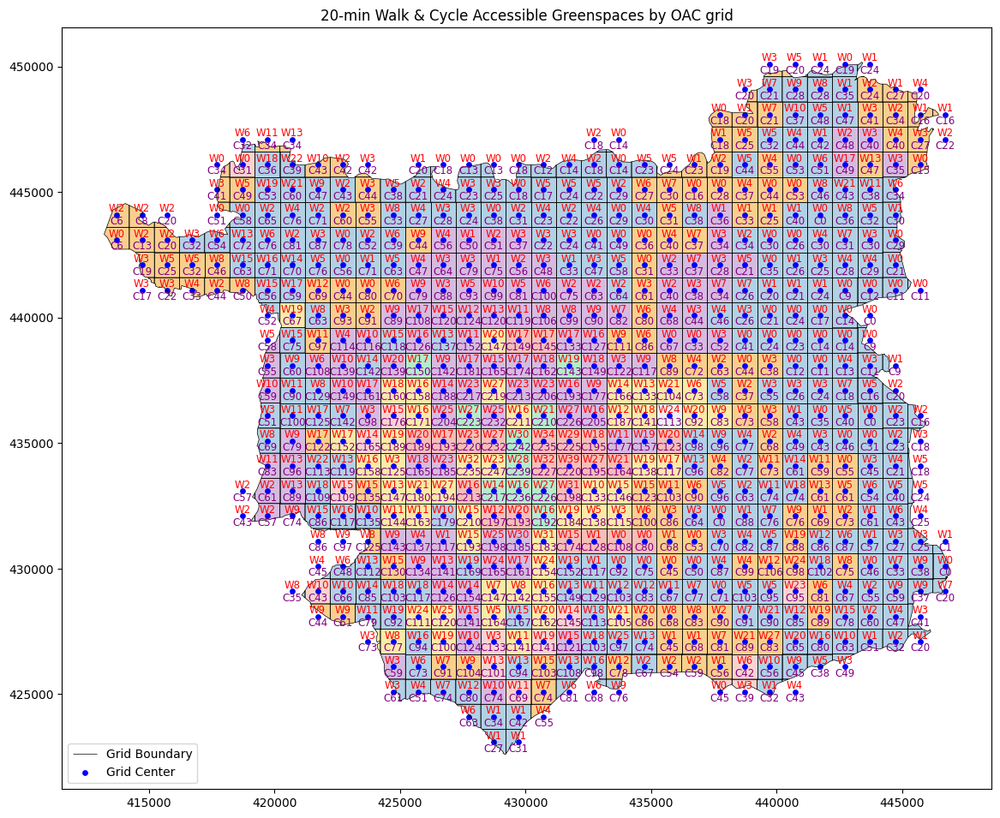

In [ ]:

fig, ax = plt.subplots(figsize=(14, 14))

# edges.plot(ax=ax, color='gray', linewidth=0.5, label='Road Network')

# color the grid cells based on the largest OAC type
for grid_type, color in color_classification.items():
    subset = grid_clipped[grid_clipped['largest_oac_type'] == grid_type]
    if not subset.empty:
        label_text = f"Grid Type: {legend_mapping.get(grid_type, 'Unknown')}"
        subset.plot(ax=ax, facecolor=color, edgecolor='none', alpha=0.6, label=label_text)

# grid boundary and center
grid_clipped.boundary.plot(ax=ax, color='black', linewidth=0.5, label='Grid Boundary')
grid_clipped['center'].plot(ax=ax, color='blue', markersize=15, label='Grid Center')

# mark the number of reachable greenspaces within the walking and cycling distance thresholds
for idx, row in grid_clipped.iterrows():
    x = row['center'].x
    y = row['center'].y
    ax.annotate("W" + str(row['greenspace_count_walk']),
                xy=(x, y),
                xytext=(x, y + 22),
                fontsize=8.5, color='red', ha='center', va='bottom')
    ax.annotate("C" + str(row['greenspace_count_bike']),
                xy=(x, y),
                xytext=(x, y - 40),
                fontsize=8.5, color='purple', ha='center', va='top')

ax.legend(loc='lower left')
ax.set_title("20-min Walk & Cycle Accessible Greenspaces by OAC grid")
plt.show()

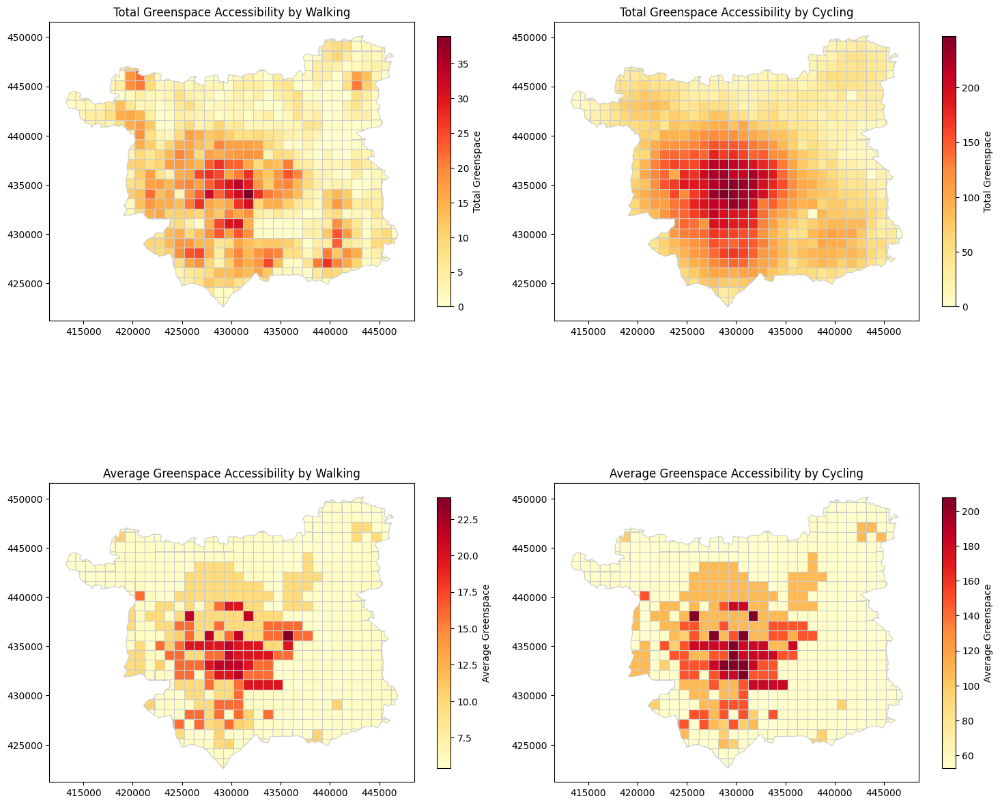

In [ ]:
# calculate the total and average greenspace counts by demographic group
sg_greenspace_counts_walk = grid_clipped.groupby('largest_oac_type')['greenspace_count_walk'].sum()
sg_greenspace_counts_bike = grid_clipped.groupby('largest_oac_type')['greenspace_count_bike'].sum()
grid_type_counts = grid['largest_oac_type'].value_counts().sort_index()

fig, axs = plt.subplots(2, 2, figsize=(15, 15))

# Heatmap for total greenspace accessibility by walking
grid_clipped.plot(column='greenspace_count_walk', cmap='YlOrRd', linewidth=0.8, ax=axs[0, 0], edgecolor='0.8',
                  legend=True, legend_kwds={'shrink': 0.5, 'label': "Total Greenspace"})
axs[0, 0].set_title("Total Greenspace Accessibility by Walking")

# Heatmap for total greenspace accessibility by cycling
grid_clipped.plot(column='greenspace_count_bike', cmap='YlOrRd', linewidth=0.8, ax=axs[0, 1], edgecolor='0.8',
                  legend=True, legend_kwds={'shrink': 0.5, 'label': "Total Greenspace"})
axs[0, 1].set_title("Total Greenspace Accessibility by Cycling")

# Heatmap for average greenspace accessibility by walking
average_accessibility_walk = grid_clipped.groupby('largest_oac_type')['greenspace_count_walk'].transform('mean')
grid_clipped['average_greenspace_count_walk'] = average_accessibility_walk
grid_clipped.plot(column='average_greenspace_count_walk', cmap='YlOrRd', linewidth=0.8, ax=axs[1, 0], edgecolor='0.8',
                  legend=True, legend_kwds={'shrink': 0.5, 'label': "Average Greenspace"})
axs[1, 0].set_title("Average Greenspace Accessibility by Walking")

# Heatmap for average greenspace accessibility by cycling
average_accessibility_bike = grid_clipped.groupby('largest_oac_type')['greenspace_count_bike'].transform('mean')
grid_clipped['average_greenspace_count_bike'] = average_accessibility_bike
grid_clipped.plot(column='average_greenspace_count_bike', cmap='YlOrRd', linewidth=0.8, ax=axs[1, 1], edgecolor='0.8',
                  legend=True, legend_kwds={'shrink': 0.5, 'label': "Average Greenspace"})
axs[1, 1].set_title("Average Greenspace Accessibility by Cycling")

plt.tight_layout()
plt.show()


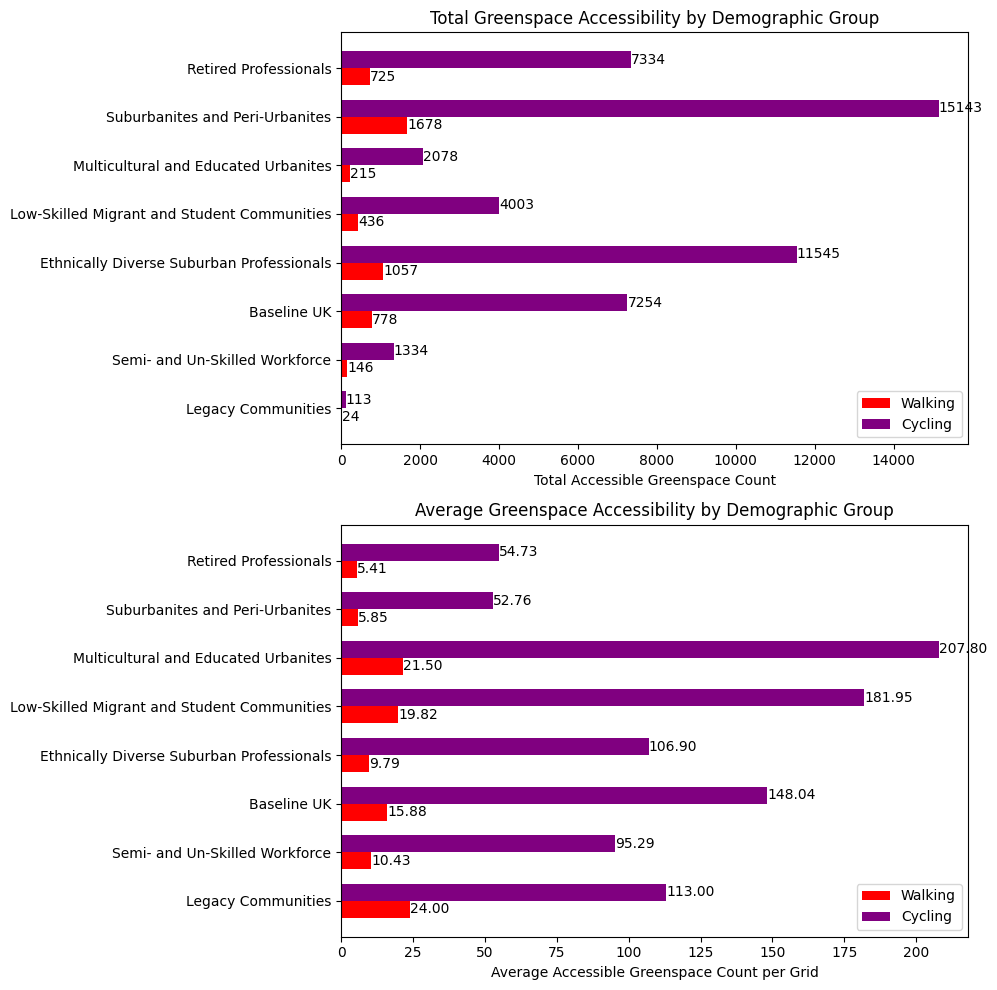

In [ ]:

# calculate total counts
total_counts = sg_greenspace_counts_walk + sg_greenspace_counts_bike

# calculate average counts
average_accessibility_walk = sg_greenspace_counts_walk / grid_type_counts
average_accessibility_bike = sg_greenspace_counts_bike / grid_type_counts

# prepare data for plotting
groups = sorted(grid_type_counts.index)

walk_total = [sg_greenspace_counts_walk[g] for g in groups]
bike_total = [sg_greenspace_counts_bike[g] for g in groups]

avg_walk = [average_accessibility_walk[g] for g in groups]
avg_bike = [average_accessibility_bike[g] for g in groups]


labels = [legend_mapping.get(g, "Unknown") for g in groups]
y_positions = np.arange(len(groups))[::-1]
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10), sharey=True)
bar_height = 0.35

# figure 1
rects1 = ax1.barh(y_positions - bar_height/2, walk_total, height=bar_height, color='red', label='Walking')
rects2 = ax1.barh(y_positions + bar_height/2, bike_total, height=bar_height, color='purple', label='Cycling')
ax1.set_xlabel("Total Accessible Greenspace Count")
ax1.set_title("Total Greenspace Accessibility by Demographic Group")
ax1.set_yticks(y_positions)
ax1.set_yticklabels(labels)
ax1.legend(loc='lower right')

for i, rect in enumerate(rects1):
    width = rect.get_width()
    ax1.text(width + 0.5, rect.get_y() + rect.get_height()/2, f'{width:.0f}', va='center')
for i, rect in enumerate(rects2):
    width = rect.get_width()
    ax1.text(width + 0.5, rect.get_y() + rect.get_height()/2, f'{width:.0f}', va='center')

# figure 2
rects3 = ax2.barh(y_positions - bar_height/2, avg_walk, height=bar_height, color='red', label='Walking')
rects4 = ax2.barh(y_positions + bar_height/2, avg_bike, height=bar_height, color='purple', label='Cycling')
ax2.set_xlabel("Average Accessible Greenspace Count per Grid")
ax2.set_title("Average Greenspace Accessibility by Demographic Group")
ax2.set_yticks(y_positions)
ax2.set_yticklabels(labels)
ax2.legend(loc='lower right')

for i, rect in enumerate(rects3):
    width = rect.get_width()
    ax2.text(width + 0.05, rect.get_y() + rect.get_height()/2, f'{width:.2f}', va='center')
for i, rect in enumerate(rects4):
    width = rect.get_width()
    ax2.text(width + 0.05, rect.get_y() + rect.get_height()/2, f'{width:.2f}', va='center')

plt.tight_layout()
plt.show()


In [ ]:
## Limitations
# 1. The granularity of the grid analysis is relatively coarse, which may overlook some subtle community differences.
# 2. The accessibility analysis is based only on the shortest path, without considering actual traffic congestion, terrain, etc.
# 3. The accessibility analysis does not consider the size, type, quality, etc., of the greenspaces.
# 4. If there are other socio-economic indicators (such as population size, income level, education level, health indicators, housing prices, etc.), the correlation between greenspace accessibility and these indicators can be explored.

C:\Users\abc96\AppData\Local\Temp\ipykernel_39052\505136856.py:2: FutureWarning:

`use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning



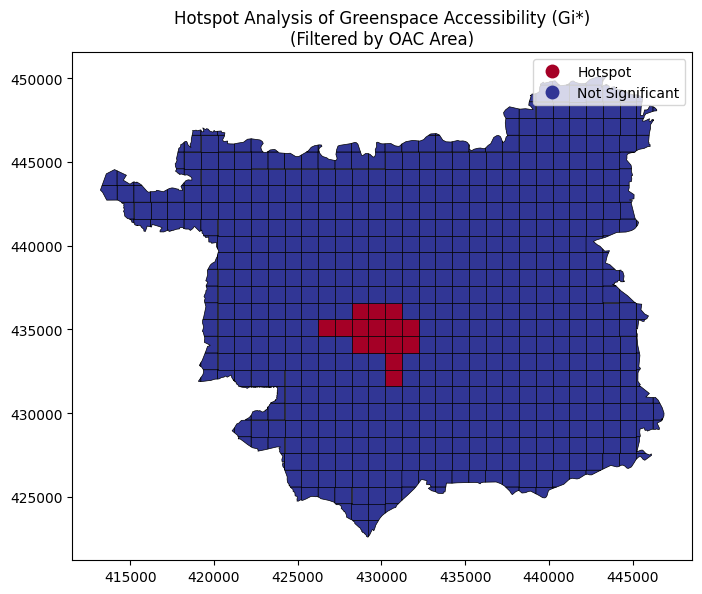

In [ ]:

# hot spot analysis
w = libpysal.weights.Queen.from_dataframe(grid_clipped)
w.transform = 'r'

greenspace_array = np.array(grid_clipped['greenspace_count_walk'], dtype=np.float64)

gi_star = esda.getisord.G_Local(greenspace_array, w)
grid_clipped['GiZScore'] = gi_star.Zs
grid_clipped['GiPValue'] = gi_star.p_sim

def classify_hotspot(row):
    if row['GiPValue'] < 0.05:
        if row['GiZScore'] > 1.96:
            return 'Hotspot'
        elif row['GiZScore'] < -1.96:
            return 'Coldspot'
        else:
            return 'Not Significant'
    else:
        return 'Not Significant'

grid_clipped['Hotspot_Class'] = grid_clipped.apply(classify_hotspot, axis=1)

fig, ax = plt.subplots(figsize=(8, 8))
grid_clipped.plot(column='Hotspot_Class', categorical=True, legend=True,
                   cmap='RdYlBu', edgecolor='black', linewidth=0.5, ax=ax)
ax.set_title("Hotspot Analysis of Greenspace Accessibility (Gi*)\n(Filtered by OAC Area)", fontsize=12)
plt.show()

## Set up

In [ ]:
pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 40.3 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numba
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
import statsmodels.api as sm
import scipy.stats as stats
import math
pd.options.mode.chained_assignment = None
import contextily as cx

## Load Data

In [ ]:
walk = gpd.read_file('Def_Paths.shp')
cycle = gpd.read_file('PLAN_CYCLE_ROUTES.shp')
designated_spaces = gpd.read_file('Designated_spaces.shp')
access_points = gpd.read_file('SE_AccessPoint.shp')
Leeds = gpd.read_file('Leeds_MSOA.shp')

In [ ]:
designated_spaces = designated_spaces.to_crs(Leeds.crs)


<Axes: >

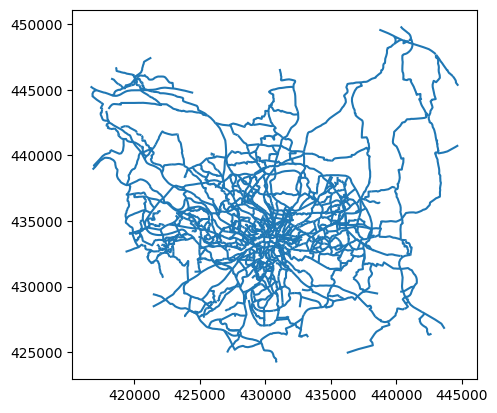

In [ ]:
cycle.plot()

<Axes: >

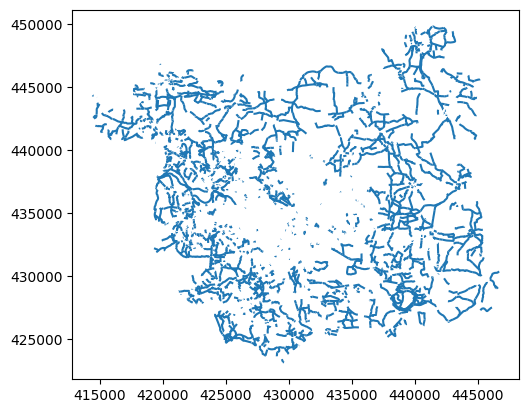

In [ ]:
walk.plot()

<Axes: >

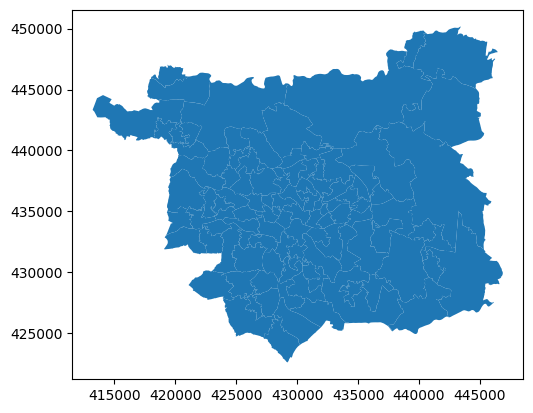

In [ ]:
Leeds.plot()

<Axes: >

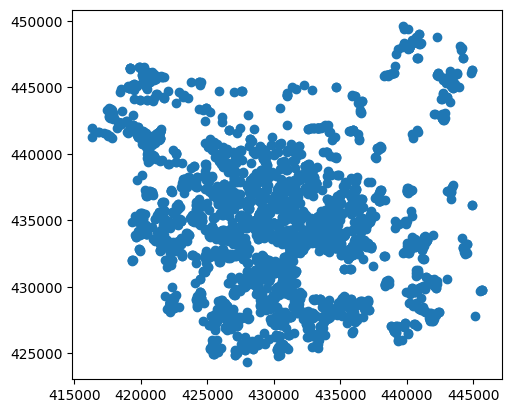

In [ ]:
Leeds['outline'] = 1
Leeds_outline = Leeds.dissolve(by = 'outline')
access_clip = gpd.clip(access_points, Leeds_outline)
access_clip.plot()

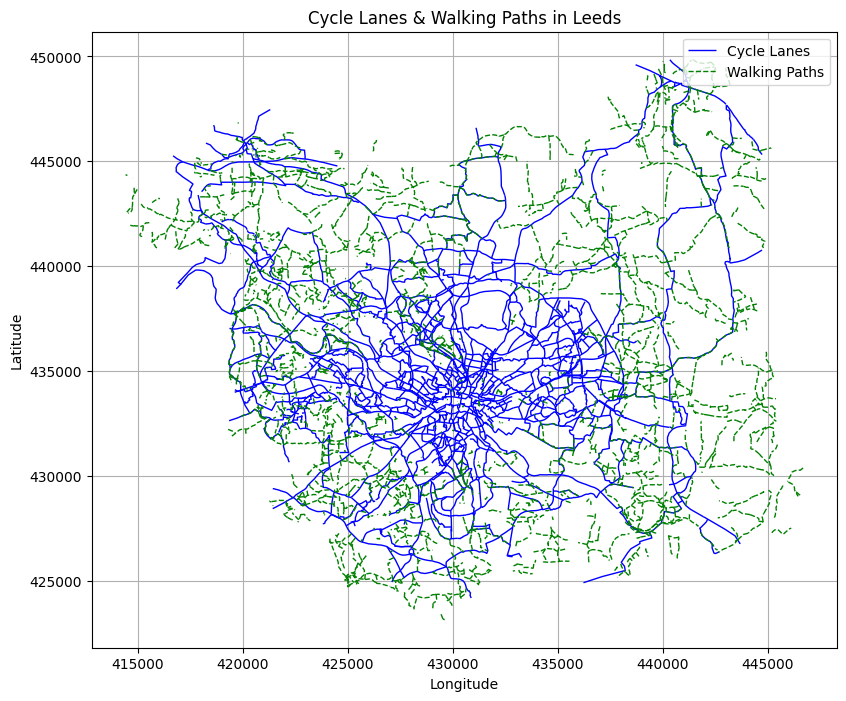

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))

cycle.plot(ax=ax, color="blue", linewidth=1, label="Cycle Lanes")
walk.plot(ax=ax, color="green", linewidth=1, linestyle="dashed", label="Walking Paths")

plt.title("Cycle Lanes & Walking Paths in Leeds")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.show()

<ipython-input-13-a64da7b6f916>:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))


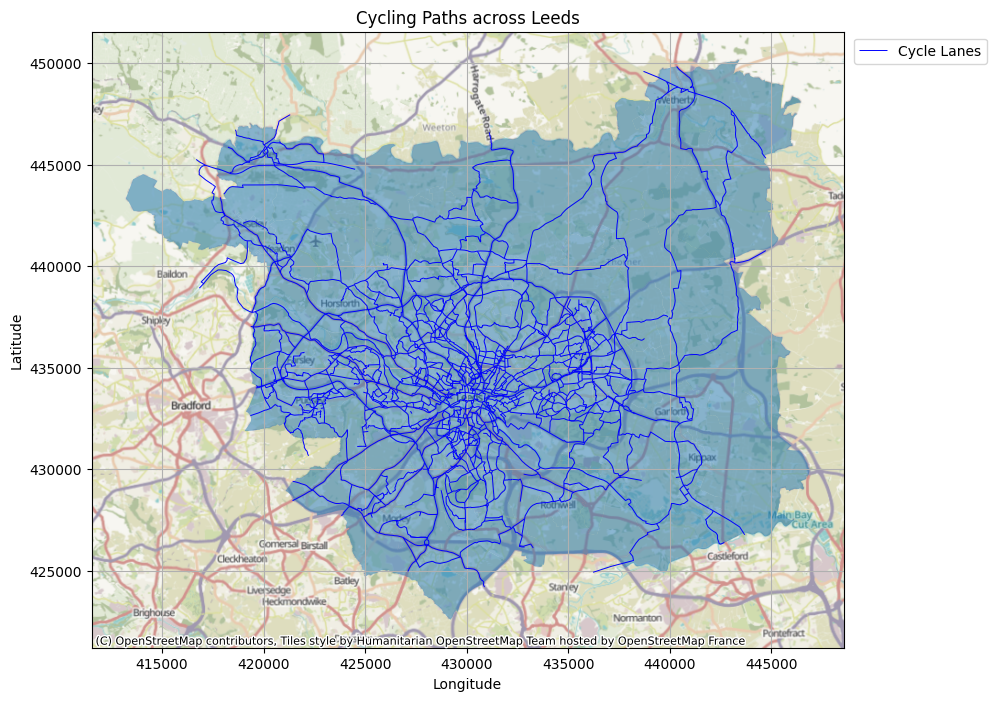

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
Leeds.plot(ax=ax, alpha=0.5, linewidth=0.5, label="Leeds Boundary")
cycle.plot(ax=ax, color="blue", linewidth=0.7, label="Cycle Lanes")
cx.add_basemap(ax, crs = 'EPSG:27700')

plt.title("Cycling Paths across Leeds")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()

<ipython-input-14-a37ce2cdcf62>:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))


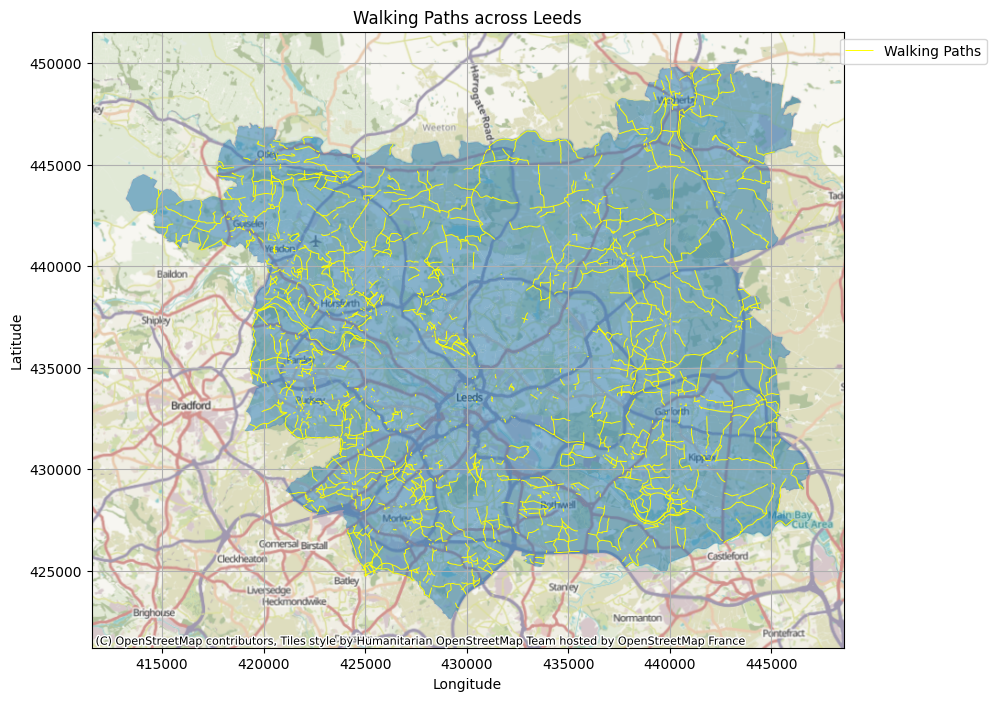

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
Leeds.plot(ax=ax, alpha=0.5, linewidth=0.5, label="Leeds Boundary")
walk.plot(ax=ax, color="yellow", linewidth=0.7, label="Walking Paths")
cx.add_basemap(ax, crs = 'EPSG:27700')

plt.title("Walking Paths across Leeds")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()

## Spatial Analysis

<ipython-input-15-30daf24bee6a>:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))


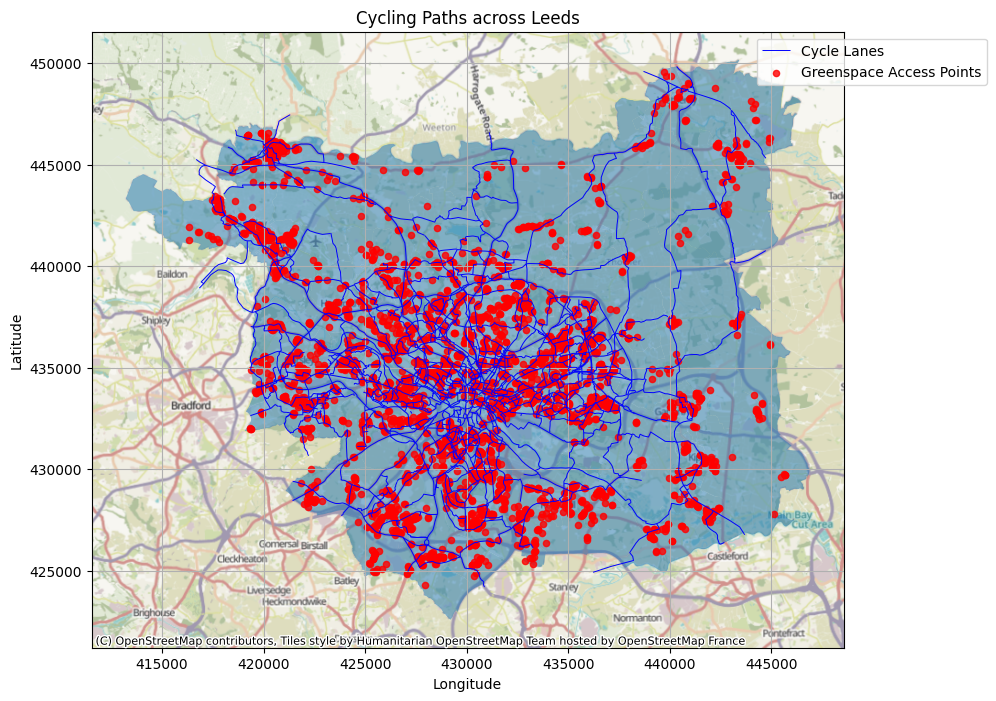

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
Leeds.plot(ax=ax, alpha=0.5, linewidth=0.5, label="Leeds Boundary")
cycle.plot(ax=ax, color="blue", linewidth=0.7, label="Cycle Lanes")
access_clip.plot(ax=ax, color="red", markersize=20, alpha=0.8, label="Greenspace Access Points")

cx.add_basemap(ax, crs = 'EPSG:27700')

plt.title("Cycling Paths across Leeds")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()

<Axes: >

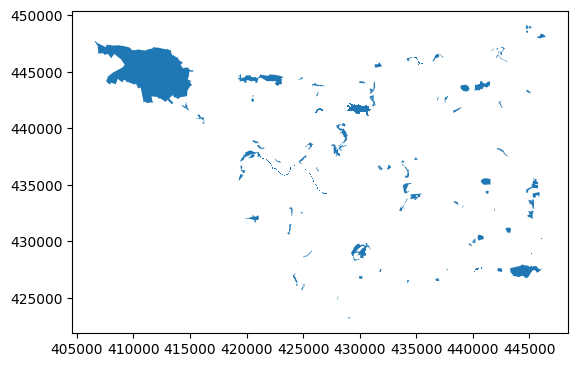

In [ ]:
designated_spaces.plot()

<Axes: >

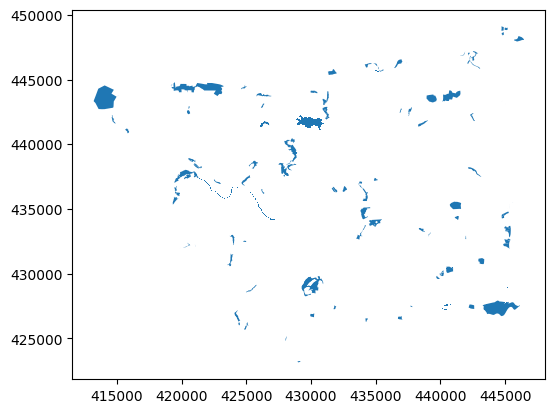

In [ ]:
designated_clip = gpd.clip(designated_spaces, Leeds_outline)
designated_clip.plot()

<ipython-input-18-dbceb9b8a971>:15: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))


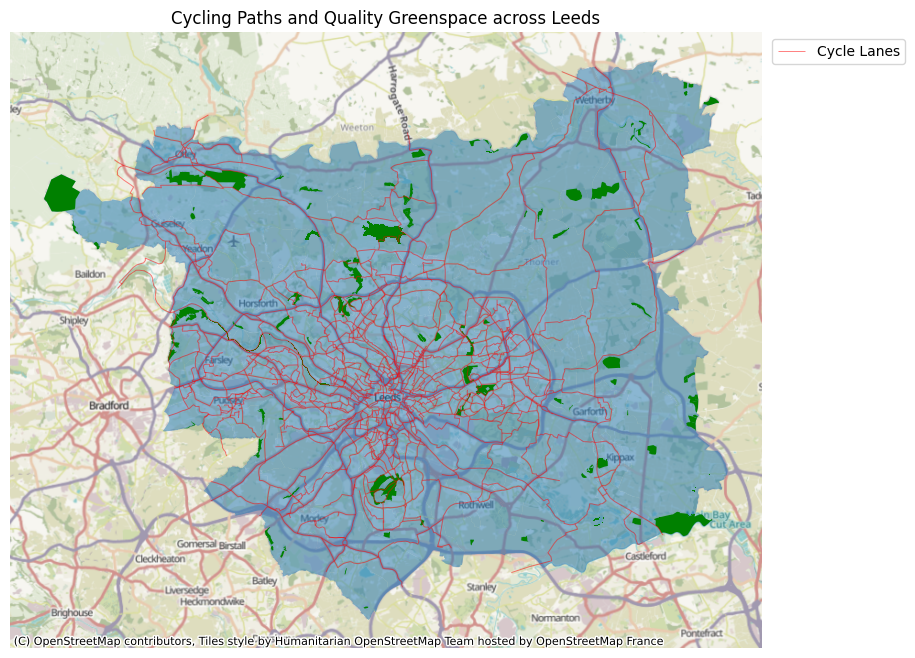

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
Leeds.plot(ax=ax, alpha=0.5, linewidth=0.5, label="Leeds Boundary")
designated_clip.plot(ax=ax, color='green')
cycle.plot(ax=ax, color="red", linewidth=0.7, alpha=0.5, label="Cycle Lanes")
cx.add_basemap(ax, crs = 'EPSG:27700')

ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.title("Cycling Paths and Quality Greenspace across Leeds")
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()

<ipython-input-19-0bba24c3a271>:15: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))


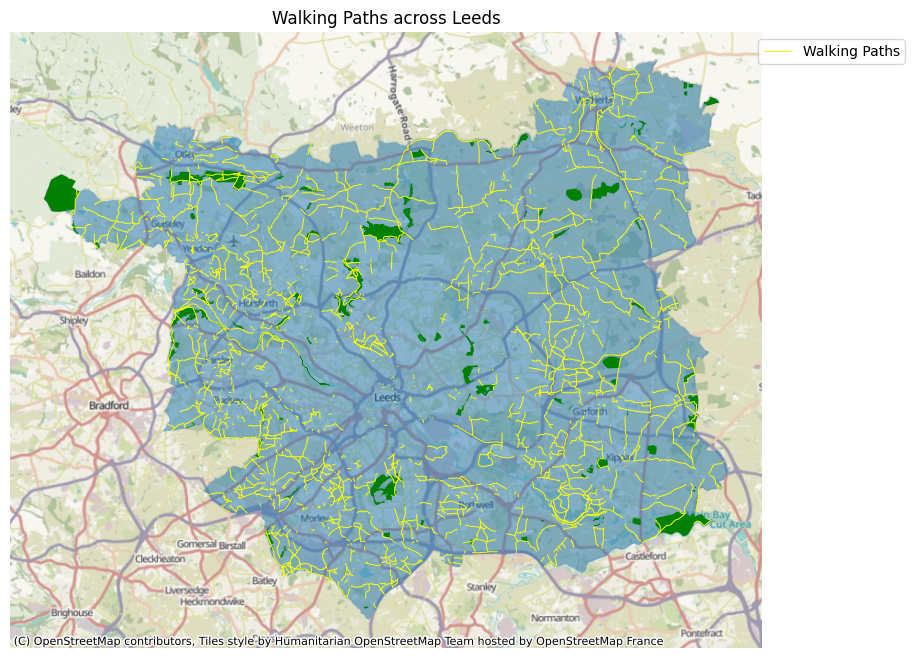

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
Leeds.plot(ax=ax, alpha=0.5, linewidth=0.5, label="Leeds Boundary")
designated_clip.plot(ax=ax, color='green')
walk.plot(ax=ax, color="yellow", linewidth=0.7, label="Walking Paths")
cx.add_basemap(ax, crs = 'EPSG:27700')

ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.title("Walking Paths across Leeds")
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()

In [ ]:
# walking
walking_speed = 83.33  # meters per minute
buffer_15_min_walk = designated_clip.buffer(15 * walking_speed)  # 15-minute walking buffer
buffer_20_min_walk = designated_clip.buffer(20 * walking_speed)  # 20-minute walking buffer

# cycling
cycling_speed = 250  # meters per minute
buffer_15_min_cycle = designated_clip.buffer(15 * cycling_speed)  # 15-minute cycling buffer
buffer_20_min_cycle = designated_clip.buffer(20 * cycling_speed)  # 20-minute cycling buffer

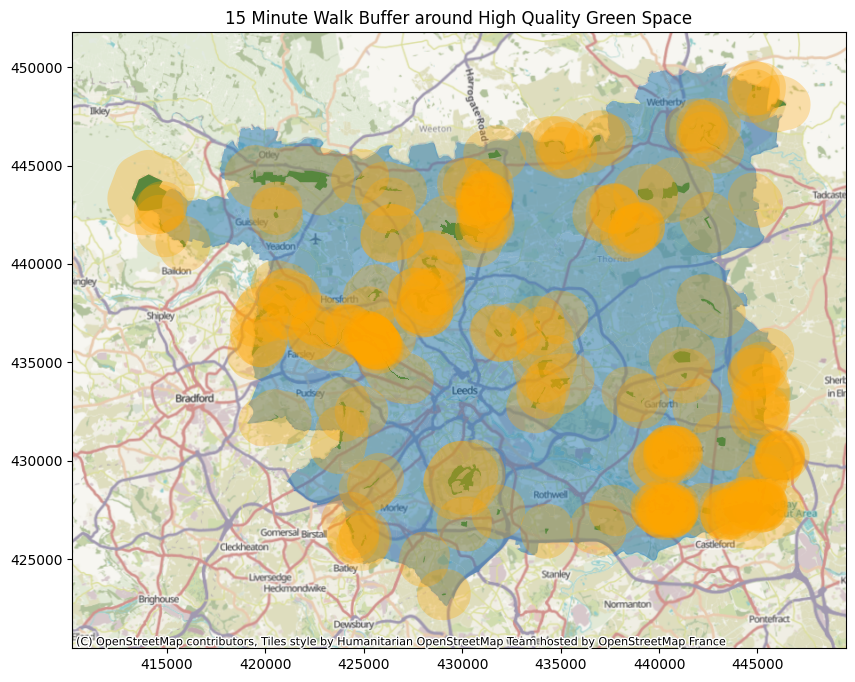

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
designated_clip.plot(ax=ax, color='green')
Leeds.plot(ax=ax, alpha=0.5, linewidth=0.5, label="Leeds Boundary")
buffer_15_min_walk.plot(ax=ax, color='orange', alpha=0.3, linestyle='--')
cx.add_basemap(ax, crs = 'EPSG:27700')
plt.title("15 Minute Walk Buffer around High Quality Green Space")
plt.show()

<ipython-input-22-031b2974fe01>:7: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="best")


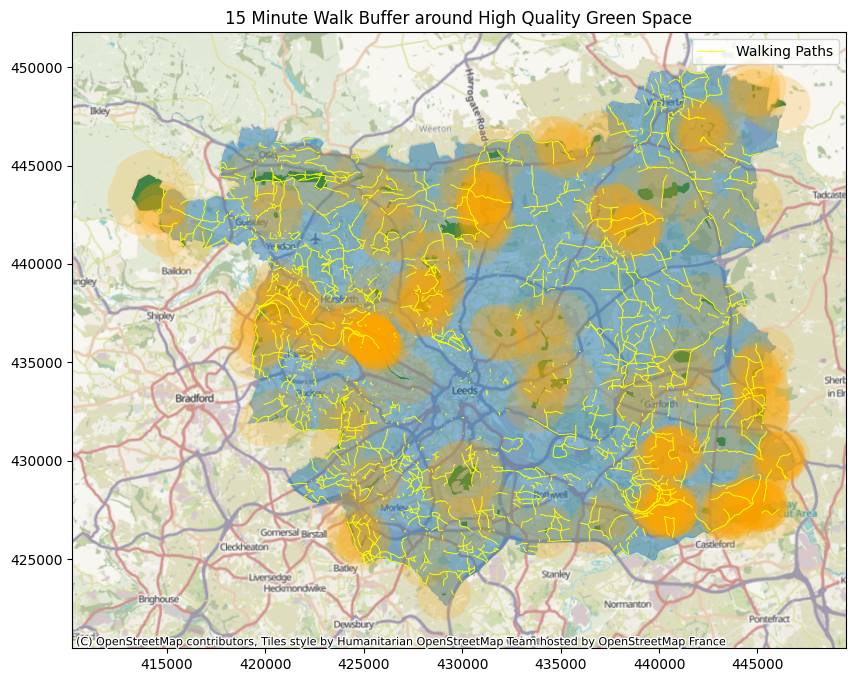

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
designated_clip.plot(ax=ax, color='green', label = "Quality Green Space", alpha = 1)
Leeds.plot(ax=ax, alpha=0.5, linewidth=0.5, label="Leeds Boundary")
walk.plot(ax=ax, color="yellow", linewidth=0.7, label="Walking Paths")
buffer_15_min_walk.plot(ax=ax, color='orange', alpha=0.2, linestyle='--', label = "15 minute walking buffer")
cx.add_basemap(ax, crs = 'EPSG:27700')
plt.legend(loc="best")
plt.title("15 Minute Walk Buffer around High Quality Green Space")
plt.show()

In [ ]:
greenspace = gpd.read_file('SE_GreenspaceSite.shp')

In [ ]:
green_clip = gpd.clip(greenspace, Leeds_outline)


<ipython-input-60-fa967079036e>:15: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))


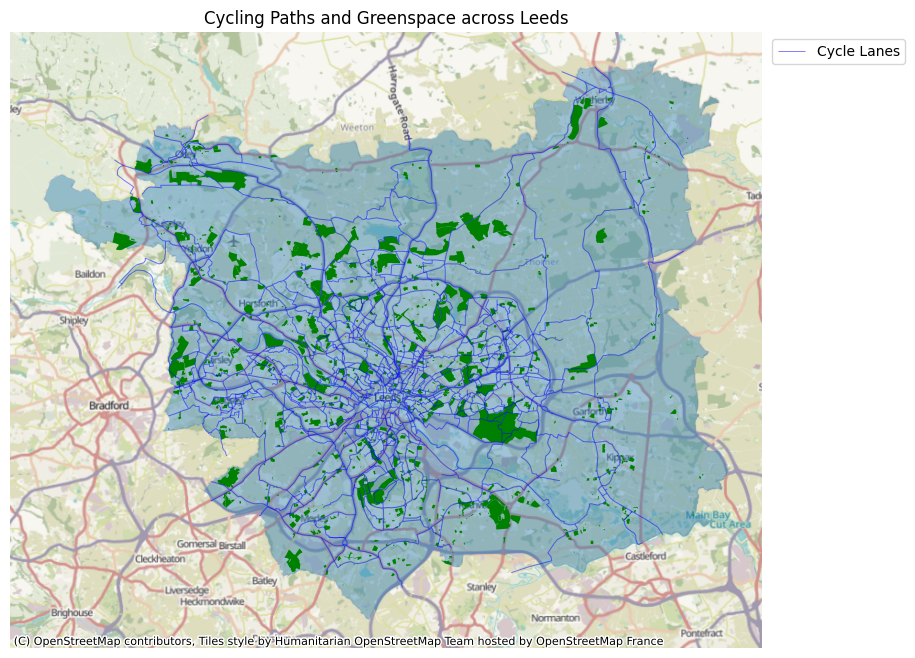

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
Leeds.plot(ax=ax, alpha=0.4, label="Leeds Boundary")
green_clip.plot(ax=ax, color='green')
cycle.plot(ax=ax, color="blue", linewidth=0.7, alpha=0.5, label="Cycle Lanes")
cx.add_basemap(ax, crs = 'EPSG:27700')

ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.title("Cycling Paths and Greenspace across Leeds")
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()

In [ ]:
census = pd.read_csv('census.csv')

In [ ]:
census.head()

,Middle layer Super Output Areas Code,Middle layer Super Output Areas,General health (4 categories) Code,General health (4 categories),Age (6 categories) Code,Age (6 categories),Observation
0,E02002330,Leeds 001,-8,Does not apply,1,Aged 15 years and under,0
1,E02002330,Leeds 001,-8,Does not apply,2,Aged 16 to 24 years,0
2,E02002330,Leeds 001,-8,Does not apply,3,Aged 25 to 34 years,0
3,E02002330,Leeds 001,-8,Does not apply,4,Aged 35 to 49 years,0
4,E02002330,Leeds 001,-8,Does not apply,5,Aged 50 to 64 years,0


In [ ]:
census = census.rename(columns={'Middle layer Super Output Areas Code': 'MSOA11CD'})


In [ ]:
census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2568 entries, 0 to 2567
Data columns (total 7 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   MSOA11CD                            2568 non-null   object
 1   Middle layer Super Output Areas     2568 non-null   object
 2   General health (4 categories) Code  2568 non-null   int64 
 3   General health (4 categories)       2568 non-null   object
 4   Age (6 categories) Code             2568 non-null   int64 
 5   Age (6 categories)                  2568 non-null   object
 6   Observation                         2568 non-null   int64 
dtypes: int64(3), object(4)
memory usage: 140.6+ KB


In [ ]:
census_merged = pd.merge(census, Leeds, on='MSOA11CD', how='inner')

In [ ]:
census_merged = gpd.GeoDataFrame(census_merged, geometry='geometry')


In [ ]:
age_dominant = census_merged.groupby("MSOA11CD")["Age (6 categories)"].agg(lambda x: x.mode().iloc[0]).reset_index()
health_dominant = census_merged.groupby("MSOA11CD")["General health (4 categories)"].agg(lambda x: x.mode().iloc[0]).reset_index()


In [ ]:
age_dominant = age_dominant[["Age (6 categories)", "MSOA11CD"]]
health_dominant = health_dominant[["General health (4 categories)", "MSOA11CD"]]


In [ ]:
print(census_merged["Age (6 categories)"].value_counts())
print(age_dominant["Age (6 categories)"].value_counts())


Age (6 categories)
Aged 15 years and under    428
Aged 16 to 24 years        428
Aged 25 to 34 years        428
Aged 35 to 49 years        428
Aged 50 to 64 years        428
Aged 65 years and over     428
Name: count, dtype: int64
Age (6 categories)
Aged 15 years and under    107
Name: count, dtype: int64


In [ ]:
print(census["General health (4 categories)"].value_counts())


General health (4 categories)
Does not apply              642
Very good or good health    642
Fair health                 642
Bad or very bad health      642
Name: count, dtype: int64


In [ ]:
census["Observation"] = census["Observation"].astype(int)

census = census[census["General health (4 categories) Code"] != -8]

age_dominant = census.loc[census.groupby("MSOA11CD")["Observation"].idxmax()][["MSOA11CD", "Age (6 categories)"]]

health_dominant = census.loc[census.groupby("MSOA11CD")["Observation"].idxmax()][["MSOA11CD", "General health (4 categories)"]]

print(age_dominant["Age (6 categories)"].value_counts())
print(health_dominant["General health (4 categories)"].value_counts())

Age (6 categories)
Aged 15 years and under    59
Aged 35 to 49 years        23
Aged 50 to 64 years        10
Aged 16 to 24 years         8
Aged 25 to 34 years         6
Aged 65 years and over      1
Name: count, dtype: int64
General health (4 categories)
Very good or good health    107
Name: count, dtype: int64


In [ ]:
health_dominant = (
    census.groupby(["MSOA11CD", "General health (4 categories)"])["Observation"]
    .sum()
    .reset_index()
    .sort_values(by=["MSOA11CD", "Observation"], ascending=[True, False])
    .drop_duplicates(subset=["MSOA11CD"], keep="first")
)[["MSOA11CD", "General health (4 categories)"]]

print(health_dominant["General health (4 categories)"].value_counts())


General health (4 categories)
Very good or good health    107
Name: count, dtype: int64


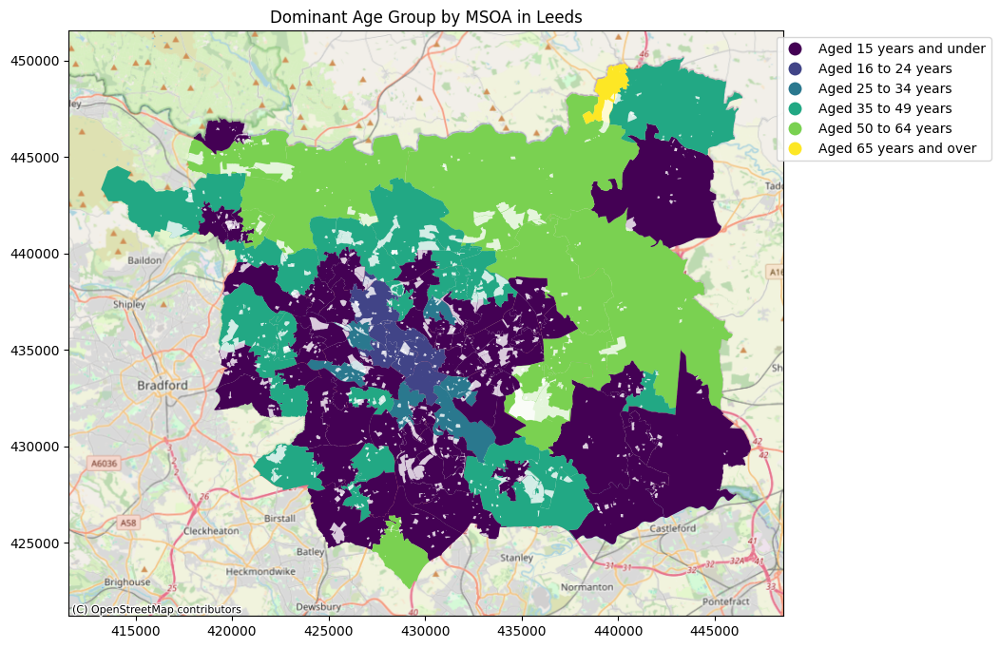

In [ ]:
Leeds_dominant = Leeds.merge(age_dominant, on="MSOA11CD", how="left")

Leeds_dominant["Age (6 categories)"] = Leeds_dominant["Age (6 categories)"].astype("category")

fig, ax = plt.subplots(figsize=(10, 8))

Leeds_dominant.plot(
    column="Age (6 categories)",
    cmap="viridis",
    legend=True,
    ax=ax,
    categorical=True,
    legend_kwds={'loc': 'upper right', 'bbox_to_anchor': (1.3, 1)}
)

green_clip.plot(
    color="white",
    alpha=0.8,
    ax=ax
)


cx.add_basemap(ax, crs=Leeds_dominant.crs, source=cx.providers.OpenStreetMap.Mapnik)

plt.title("Dominant Age Group by MSOA in Leeds")

plt.show()

In [ ]:
greenspace_count = gpd.sjoin(Leeds_dominant, green_clip, how="left", predicate="intersects")
greenspace_count = greenspace_count.groupby("MSOA11CD").size().reset_index(name="Greenspace_Count")
Leeds_dominant = Leeds_dominant.merge(greenspace_count, on="MSOA11CD", how="left")
Leeds_dominant["Greenspace_Count"] = Leeds_dominant["Greenspace_Count"].fillna(0)

In [ ]:
print(Leeds_dominant["Greenspace_Count"].describe())

count    107.000000
mean      14.943925
std        7.117387
min        3.000000
25%        9.000000
50%       14.000000
75%       20.000000
max       36.000000
Name: Greenspace_Count, dtype: float64


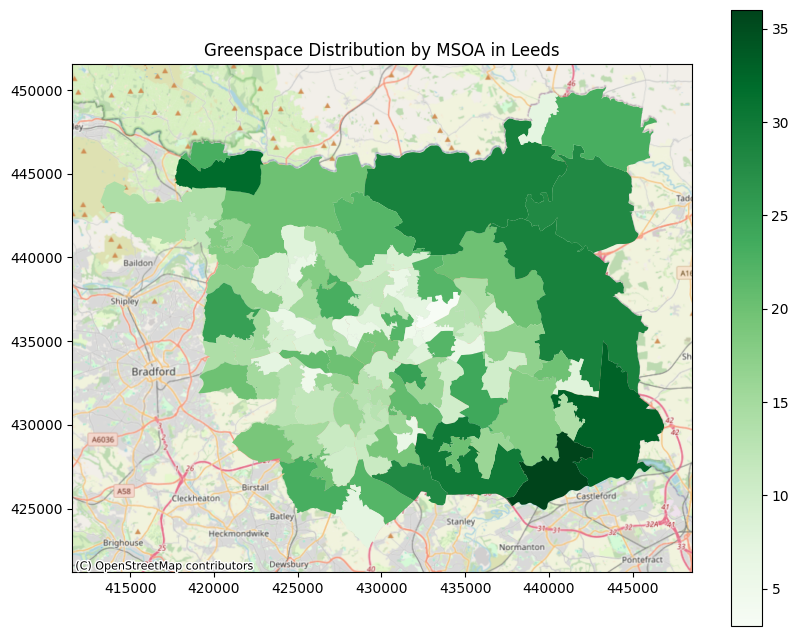

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
Leeds_dominant.plot(
    column="Greenspace_Count",
    cmap="Greens",
    legend=True,
    ax=ax
)
cx.add_basemap(ax, crs=Leeds_dominant.crs, source=cx.providers.OpenStreetMap.Mapnik)
plt.title("Greenspace Distribution by MSOA in Leeds")
plt.show()

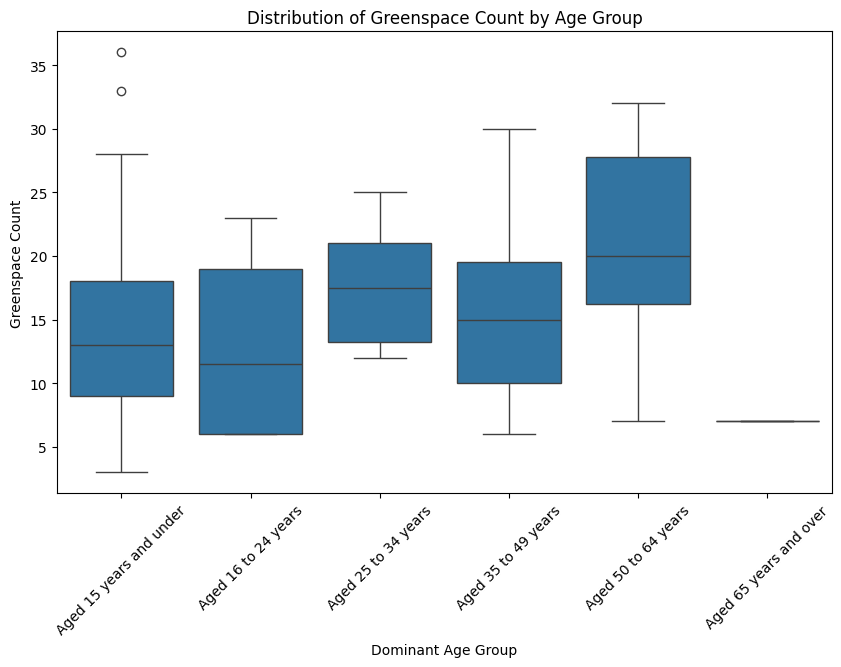

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(x=Leeds_dominant["Age (6 categories)"], y=Leeds_dominant["Greenspace_Count"])
plt.xticks(rotation=45)
plt.xlabel("Dominant Age Group")
plt.ylabel("Greenspace Count")
plt.title("Distribution of Greenspace Count by Age Group")
plt.show()

In [ ]:
age_group_stats = Leeds_dominant.groupby("Age (6 categories)")["Greenspace_Count"].describe()
print(age_group_stats)

                         count       mean       std   min    25%   50%    75%  \
Age (6 categories)                                                              
Aged 15 years and under   59.0  13.966102  7.107466   3.0   9.00  13.0  18.00   
Aged 16 to 24 years        8.0  12.750000  6.840008   6.0   6.00  11.5  19.00   
Aged 25 to 34 years        6.0  17.666667  5.354126  12.0  13.25  17.5  21.00   
Aged 35 to 49 years       23.0  15.478261  6.207544   6.0  10.00  15.0  19.50   
Aged 50 to 64 years       10.0  20.400000  8.262364   7.0  16.25  20.0  27.75   
Aged 65 years and over     1.0   7.000000       NaN   7.0   7.00   7.0   7.00   

                          max  
Age (6 categories)             
Aged 15 years and under  36.0  
Aged 16 to 24 years      23.0  
Aged 25 to 34 years      25.0  
Aged 35 to 49 years      30.0  
Aged 50 to 64 years      32.0  
Aged 65 years and over    7.0  


<ipython-input-61-9cbd69f5b058>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_group_stats = Leeds_dominant.groupby("Age (6 categories)")["Greenspace_Count"].describe()
